(sem_bayes_workflow)=
# Bayesian Workflow with SEMs 

:::{post} September, 2025
:tags: confirmatory factor analysis, structural equation models, 
:category: advanced, reference
:author: Nathaniel Forde
:::

This case study extends the themes of {ref}`contemporary Bayesian workflow <bayesian_workflow>` and {ref}`Structural Equation Modelling <cfa_sem_notebook>`.
While both topics are well represented in the PyMC examples library, our goal here is to show how the principles of the Bayesian workflow can be applied concretely to structural equation models (SEMs). The iterative and expansionary strategies of model development for SEMs provide an independent motivation for the recommendations of {cite:p}`gelman2020bayesian` stemming from the SEM literature broadly. But {cite:p}`kline2023principles` in particular highlights the utility of a staggered approach to model development as a diagnostic for model mis-specification.  

A further goal is to strengthen the foundation for SEM modeling in PyMC. We demonstrate how to use different sampling strategies, both conditional and marginal formulations, to accommodate mean structures and hierarchical effects. These extensions showcase the flexibility and expressive power of Bayesian SEMs.

#### Structure of the Presentation

- Workflow: Bayesian and SEM
  - Job Satisfaction Data
  - Mathematical Specification
- Modelling
  - CFA
  - SEM Conditional Formulation
  - SEM Marginal Formulation
  - SEM Mean Structure Formulation
  - Sensitivity Analysis: Comparing Model Fits
- Parameter Recovery Models
  - SEM Hierarchical Formulation
  - SEM + Discrete Choice
- Conclusion: Statistical Modelling and Craft


### The Bayesian Workflow
Recall the stages of the Bayesian workflow.

:::{admonition} The Bayesian Workflow Stages
:class: tip

- **Conceptual model building**: Translate domain knowledge into statistical assumptions
- **Prior predictive simulation**: Check if priors generate reasonable data
- **Computational implementation**: Code the model and ensure it runs
- **Fitting and diagnostics**: Estimate parameters and check convergence
- **Model evaluation**: Assess model fit using posterior predictive checks
- **Model comparison**: Compare alternative models systematically
- **Model expansion or simplification**: Iterate based on findings
- **Decision analysis**: Use the model for predictions or decisions
:::

The structure of the SEM workflow mirrors the Bayesian workflow closely. Each step—from specifying measurement models to refining residual covariances—reflects the same cycle of hypothesis formulation, model testing, and iterative improvement.

### The SEM Workflow
- __Confirm the Factor Structure__ (CFA):
  - Validate that our measurement model holds i.e. our initial conceptual modelling.
  - Ensure latent constructs are reliably represented by observed indicators.

- __Layer Structural Paths__:
  - Add theoretically-motivated regressions between constructs.
  - Assess whether hypothesized relationships improve model fit.

- __Refine with Residual Covariances__:
  - Account for specific shared variance not captured by factors.
  - Keep structure transparent while improving realism.

- __Iteratively Validate__:
  - Each step asks: Does this addition honor theory? Improve fit?
  - Workflow = constant negotiation between parsimony and fidelity.

These approaches complement one another. We'll see how the iterative and expansionary approach to model development is crucial for understanding the subtleties of SEM models. How our understanding grows as we track their implications across increasingly expressive candidate model structures.

In many settings, statistical modelling has become a game — a contest of metrics, accuracy scores, and leaderboard performances. Each modelling project promises improvement, but only within the narrow boundaries the metric defines. Our rich, complex aims of scientific discovery, understanding, and generalisable insight are replaced by simplified numbers that are easy to compare and optimize. The result is a kind of methodological gamification: we chase scores instead of comprehension. This is the contrast case against which we set Bayesian workflow. We'll make the case below to treat statistical modelling not as simplistic competition, but as a rewarding craft. A craft that underpins the entire scientific enterprise; our most successful epistemological project.

In [1]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor
import pytensor.tensor as pt
import seaborn as sns

warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
%config InlineBackend.figure_format = 'retina'  # high resolution figures
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(42)

### Job Satisfaction and Bayesian Workflows

The data we will examine for this case study is drawn from an example discussed by {cite:p}`vehkalahti2019multivariate` around the drivers of Job satisfaction. In particular the focus is on how Constructive thought strategies can impact job satisfaction. We have 12 related measures. 

- Constructive Thought Strategies (CTS): Thought patterns that are positive or helpful, such as:
  - __Self-Talk__ (positive internal dialogue): `ST`
  - __Mental Imagery__ (visualizing successful performance or outcomes): `MI` 
  - __Evaluating Beliefs & Assumptions__ (i.e. critically assessing one’s internal assumptions): `EBA`
- Dysfunctional Thought Processes: (`DA1`–`DA3`)
- Subjective Well Being: (`UF1`, `UF2`, `FOR`)
- Job Satisfaction: (`JW1`–`JW3`)

The idea is that the covariance structure of these variables can be properly discerned with a Structural equation modelling approach. In their book Vehkalahti and Everitt report the derived correlation and covariance structure. Here we will sample data from the multivariate normal distribution they described and proceed in steps to model each component of their SEM model. This will allow us to additively layer and motivate each part of the SEM model. 

In [3]:
# Standard deviations
stds = np.array(
    [0.939, 1.017, 0.937, 0.562, 0.760, 0.524, 0.585, 0.609, 0.731, 0.711, 1.124, 1.001]
)

n = len(stds)

# fmt: off

# Lower triangular correlation values as a flat list
corr_values = [
    1.000,
    .668, 1.000,
    .635, .599, 1.000,
    .263, .261, .164, 1.000,
    .290, .315, .247, .486, 1.000,
    .207, .245, .231, .251, .449, 1.000,
   -.206, -.182, -.195, -.309, -.266, -.142, 1.000,
   -.280, -.241, -.238, -.344, -.305, -.230,  .753, 1.000,
   -.258, -.244, -.185, -.255, -.255, -.215,  .554,  .587, 1.000,
    .080,  .096,  .094, -.017,  .151,  .141, -.074, -.111,  .016, 1.000,
    .061,  .028, -.035, -.058, -.051, -.003, -.040, -.040, -.018,  .284, 1.000,
    .113,  .174,  .059,  .063,  .138,  .044, -.119, -.073, -.084,  .563,  .379, 1.000
]

# fmt: on

# Fill correlation matrix
corr_matrix = np.zeros((n, n))
idx = 0
for i in range(n):
    for j in range(i + 1):
        corr_matrix[i, j] = corr_values[idx]
        corr_matrix[j, i] = corr_values[idx]
        idx += 1

# Covariance matrix: Sigma = D * R * D
cov_matrix = np.outer(stds, stds) * corr_matrix
# cov_matrix_test = np.dot(np.dot(np.diag(stds), corr_matrix), np.diag(stds))
FEATURE_COLUMNS = ["JW1", "JW2", "JW3", "UF1", "UF2", "FOR", "DA1", "DA2", "DA3", "EBA", "ST", "MI"]
corr_df = pd.DataFrame(corr_matrix, columns=FEATURE_COLUMNS)

cov_df = pd.DataFrame(cov_matrix, columns=FEATURE_COLUMNS)


def make_sample(cov_matrix, size, columns, missing_frac=0.0, impute=False, mean_structure=False):
    if mean_structure:
        mus = np.random.normal(0, 3, size=12)
    else:
        mus = [0] * 12
    sample_df = pd.DataFrame(
        np.random.multivariate_normal(mus, cov_matrix, size=size), columns=FEATURE_COLUMNS
    )
    if missing_frac > 0.0:
        total_values = sample_df.size
        num_nans = int(total_values * missing_frac)

        # Choose random flat indices
        nan_indices = np.random.choice(total_values, num_nans, replace=False)

        # Convert flat indices to (row, col)
        rows, cols = np.unravel_index(nan_indices, sample_df.shape)

        # Set the values to NaN
        sample_df.values[rows, cols] = np.nan

    if impute:
        sample_df.fillna(sample_df.mean(axis=0), inplace=True)

    return sample_df


sample_df = make_sample(cov_matrix, 263, FEATURE_COLUMNS)


def header_style():
    return [
        "color: red; font-weight: bold;",
        "color: blue; font-weight: bold;",
        "color: green; font-weight: bold;",
    ]


sample_df.head().style.set_properties(
    **{"background-color": "skyblue"}, subset=["JW1", "JW2", "JW3"]
).set_properties(**{"background-color": "moccasin"}, subset=["DA1", "DA2", "DA3"]).set_properties(
    **{"background-color": "lightcoral"}, subset=["EBA", "ST", "MI"]
)

,JW1,JW2,JW3,UF1,UF2,FOR,DA1,DA2,DA3,EBA,ST,MI
0,0.820111,1.181258,1.585371,0.558307,0.439924,0.871251,0.032091,-0.274770,-0.862341,-0.169839,-0.722636,0.861360
1,-0.032851,-1.249167,0.855345,0.912368,0.496281,0.124522,-0.473124,0.116901,0.298222,0.039183,-0.370301,0.328573
2,1.745145,0.116294,0.683520,0.248579,1.291911,0.681872,-1.165572,-0.550445,-0.451510,1.981498,2.234750,2.457257
3,-0.674054,-0.196500,-0.688249,0.504622,-0.113717,0.059695,0.684994,-0.041186,0.021473,-1.683083,0.149398,-0.902301
4,-0.295026,-0.575694,-1.350853,0.292954,-1.055491,-0.364540,-0.360621,-0.730082,0.260822,0.288157,-0.459076,0.822735


Interestingly, the Bayesian workflow embodies the same constructive strategies it studies. At each stage, we ask: _Do I believe this model? What assumptions am I making? Is the evidence consistent with my expectations?_ This reflective process , mirroring the “evaluating beliefs and assumptions” mindset, builds models that are not only statistically robust but conceptually grounded. By the end, we arrive at a set of defensible findings which, fittingly, support a genuine sense of satisfaction with a job well done.

### Mathematical Specification

Before we turn to implementation, let’s formalize the model mathematically.

In our set up of a Structural Equation Model we have observed variables $y \in R^{p}$, here (p=12) and $\eta \in R^{m}$ latent factors (m=4). The basic structural equation model (SEM) consists of two parts - the measurement model and the structural regressions. 

_The Measurement Model_ is the factor-structure we seek to _confirm_ in our analysis. It is called a measurement model because we view the observable metrics as indicators of the thing we actually want to measure. The observable metrics are grouped under a unifying "factor" or construct. The idea that each of the indicators are imprecise gauges of the latent factor. The hope is that collectively they provide a better gauge of this hard to measure quantity e.g. satisfaction and well-being. This can be thought of as a data-reduction technique, where we reduce the complex multivariate data set to a smaller collection of inferred features. However, in most SEM applications the factors themselves are of independent interest, not merely a modelling convenience.

In factor analysis we posit a factor-structure and estimate how each latent factor determines the observed metrics. The assumed data generating structure says that the factors cause the observed metrics. The inferential task works backwards, we want to infer the shape of the latent factors conditional on the observed metrics.

$$ \overbrace{y_i}^{indicators} = \overbrace{\Lambda \eta_i}^{factors} + \varepsilon_i, 
\quad \varepsilon_i \sim \mathcal N(0, \Psi).
$$

where $\Lambda$ is a 12 x 4 matrix, and $\eta$ is an $N$ x 4 matrix, for $N$ observations i.e. the matrix of latent scores on each of the four factors for all individual responses. In the measurement model we're aiming to ensure that the observed metrics are well grouped under a single factor. That they "move" well together and respond to changes in the factor. 

_The Structural model_ encodes the regression paths between the latent constructs. Mathematically this is achieved within a 4 X 4 matrix $B$, where the latent factors are specified as predictors of other latent factors as theory dictates i.e no latent factor predicts itself, but some may bear on others. In our case we're aiming to see how constructive thought strategies predicts job satisfaction. The influence paths of one factor on another can be direct and mediated through the other factors. 

$$
\eta_i = B \eta_i + \zeta_i, 
\quad \zeta_i \sim \mathcal N(0, \Psi_{\zeta}).
$$

$$
\eta_i = (I - B)^{-1} \zeta_i.
$$

In the structural model we specify how we believe the latent constructs relate to one another. The term $(I - B)^{-1}$  is sometimes called the total effects matrix because it can be expanded as $I + B + B^{2} + B^{3}...$ summing all possible chains of paths in the system. As we'll see the structural and mediating paths between these latent constructs can be additive. This observation allows us to very elegantly derive total, indirect and direct effects within the system. 

We can express the SEM in either a conditional or marginal formulation. The conditional form explicitly samples the latent variables, while the marginal form integrates them out of the likelihood.

#### Conditional Formulation
This formulation treats the latent variables as parameters to be sampled directly. This is conceptually straightforward but often computationally demanding for Bayesian samplers.

$$
\zeta_i \sim \mathcal N(0, \Psi_{\zeta}). 

\\

\eta_i = (I-B)^{-1} \zeta_i.

\\

\mu_i = \Lambda \eta_i.

\\

y_i \mid \eta_i \sim \mathcal MvN(\mu_i, \Psi)

$$

which highlights that the conditional formulation samples the latent variables explicitly. 

#### Marginal Formulation
Here the focus is on deriving the covariance matrix. 

$$\Sigma_{\mathcal{y}} = \Psi + \Lambda(I - B)^{-1}\Psi_{\zeta}(I - B)^{T}\Lambda^{T} $$

$$ \mathcal{y} \sim MvN(\mu, \Sigma_{y})$$

This approach marginalises out the latent draws in the likelihood and avoids sampling the latent terms directly. Instead we can estimate a point estimate for each of the latent scores by regression approach calculating.

$$ \hat{\eta} = \hat{\Psi}\hat{\Lambda^{T}}\hat{\Sigma^{-1}}(y - \hat{\mu})$$

We'll introduce each of these components are additional steps as we layer over the basic factor model

#### Setting up Utility Functions

For this exercise we will lean on a  range of utility functions to build and compare the expansionary sequence. These functions include repeated steps that will be required for any SEM model. These functions modularize the model-building process and make it easier to compare successive model expansions.

The most important cases are functions like `make_lambda` to sample and fix the scale of the covariates that contribute to each latent factor. Similarly, we have the `make_B` which samples the parameter values of the path coefficients between the latent constructs, while arranging them in a matrix that can be passed through matrix multiplication routines. Additionally, we have a `make_Psi` function which samples parameter values for particular covariances that gets deployed to encode aspects of the variance in our system not captured by the covariances among the latent factors. These three helper functions determine the structure of the SEM model and variants of each can be used to construct any SEM structure.

We also save some plotting functions which will be used to compare models. 

In [4]:
coords = {
    "obs": list(range(len(sample_df))),
    "indicators": FEATURE_COLUMNS,
    "indicators_1": ["JW1", "JW2", "JW3"],  # job satisfaction
    "indicators_2": ["UF1", "UF2", "FOR"],  # well being
    "indicators_3": ["DA1", "DA2", "DA3"],  # dysfunction
    "indicators_4": ["EBA", "ST", "MI"],  # constructive thought strategies
    "latent": ["satisfaction", "well being", "dysfunctional", "constructive"],
    "latent1": ["satisfaction", "well being", "dysfunctional", "constructive"],
    "paths": [
        "dysfunctional ~ constructive",
        "well being ~ dysfunctional",
        "well being ~ constructive",
        "satisfaction ~ well being",
        "satisfaction ~ dysfunction",
        "satisfaction ~ constructive",
    ],
    "sd_params": [i + "_sd" for i in FEATURE_COLUMNS],
    "corr_params": ["UF1 ~~ FOR"],
}

COLUMN_ORDER_LKUP = dict(zip(FEATURE_COLUMNS, range(len(FEATURE_COLUMNS))))
LATENT_ORDER_LKUP = dict(zip(coords["latent"], range(len(coords["latent"]))))


def make_lambda(indicators, name="lambdas1", priors=[1, 10]):
    """Takes an argument indicators which is a string in the coords dict"""
    temp_name = name + "_"
    lambdas_ = pm.Normal(temp_name, priors[0], priors[1], dims=(indicators,))
    # Force a fixed scale on the factor loadings for factor 1
    # This is to ensure that the scale of the latent construct is well defined
    # without this anchoring assumption, the magnitude of the latent factor could
    # be anything
    lambdas_1 = pm.Deterministic(name, pt.set_subtensor(lambdas_[0], 1), dims=(indicators,))
    return lambdas_1


def make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4):
    Lambda = pt.zeros((12, 4))
    Lambda = pt.set_subtensor(Lambda[0:3, 0], lambdas_1)
    Lambda = pt.set_subtensor(Lambda[3:6, 1], lambdas_2)
    Lambda = pt.set_subtensor(Lambda[6:9, 2], lambdas_3)
    Lambda = pt.set_subtensor(Lambda[9:12, 3], lambdas_4)
    Lambda = pm.Deterministic("Lambda", Lambda, dims=("indicators", "latent"))
    return Lambda


def make_B(priors=[0, 0.5], group_suffix=""):
    coefs = pm.Normal(
        f"mu_betas{group_suffix}", [0, 0, 0, 0, 0, 0], [1, 1, 1, 1, 1, 1], dims="paths"
    )

    zeros = pt.zeros((4, 4))
    ## dysfunctional ~ constructive
    zeros = pt.set_subtensor(
        zeros[LATENT_ORDER_LKUP["constructive"], LATENT_ORDER_LKUP["dysfunctional"]], coefs[0]
    )
    ## well being ~ dysfunctional
    zeros = pt.set_subtensor(
        zeros[LATENT_ORDER_LKUP["dysfunctional"], LATENT_ORDER_LKUP["well being"]], coefs[1]
    )
    ## well being ~ constructive
    zeros = pt.set_subtensor(
        zeros[LATENT_ORDER_LKUP["constructive"], LATENT_ORDER_LKUP["well being"]], coefs[2]
    )
    ## satisfaction ~ well being
    zeros = pt.set_subtensor(
        zeros[LATENT_ORDER_LKUP["well being"], LATENT_ORDER_LKUP["satisfaction"]], coefs[3]
    )
    ## satisfaction ~ dysfunction
    zeros = pt.set_subtensor(
        zeros[LATENT_ORDER_LKUP["dysfunctional"], LATENT_ORDER_LKUP["satisfaction"]], coefs[4]
    )
    ## satisfaction ~ constructive
    coefs_ = pt.set_subtensor(
        zeros[LATENT_ORDER_LKUP["constructive"], LATENT_ORDER_LKUP["satisfaction"]], coefs[5]
    )
    B = pm.Deterministic(f"B_{group_suffix}", coefs_, dims=("latent", "latent1"))
    return B


def make_Psi(indicators, name="Psi_cov"):
    """Takes an argument indicators which is a string in the coords dict"""
    temp_name = name + "_"
    n = len(coords[indicators])
    cov_params = pm.InverseGamma(temp_name, 3, 4, dims="sd_params")
    r = pt.zeros((n, n))
    beta_params = pm.Beta(temp_name + "beta", 1, 1, dims="corr_params")
    for i in range(len(coords[indicators])):
        r = pt.set_subtensor(r[i, i], 1)
    # UF1 ~~ FOR
    r = pt.set_subtensor(r[COLUMN_ORDER_LKUP["UF1"], COLUMN_ORDER_LKUP["FOR"]], beta_params[0])
    s = pt.diag(cov_params)
    cov = (s @ r) @ pt.transpose(s @ r)
    r = pm.Deterministic("Psi_corr", r)
    cov = pm.Deterministic("Psi_cov", cov)

    return cov


def make_ppc(
    idata,
    df,
    samples=100,
    drivers=FEATURE_COLUMNS,
    dims=(2, 3),
):
    fig, axs = plt.subplots(dims[0], dims[1], figsize=(20, 10))
    axs = axs.flatten()
    for i in range(len(drivers)):
        for j in range(samples):
            temp = az.extract(idata["posterior_predictive"].sel({"likelihood_dim_3": i}))[
                "likelihood"
            ].values[:, j]
            temp = pd.DataFrame(temp, columns=["likelihood"])
            if j == 0:
                axs[i].hist(df[drivers[i]], alpha=0.3, ec="black", bins=20, label="Observed Scores")
                axs[i].hist(
                    temp["likelihood"], color="purple", alpha=0.1, bins=20, label="Predicted Scores"
                )
            else:
                axs[i].hist(df[drivers[i]], alpha=0.3, ec="black", bins=20)
                axs[i].hist(temp["likelihood"], color="purple", alpha=0.1, bins=20)
            axs[i].set_title(f"Posterior Predictive Checks {drivers[i]}")
            axs[i].legend()
    plt.tight_layout()
    plt.show()


def get_posterior_resids(idata, samples=100, metric="cov"):
    resids = []
    for i in range(samples):
        if metric == "cov":
            model_cov = pd.DataFrame(
                az.extract(idata["posterior_predictive"])["likelihood"][:, :, i]
            ).cov()
            obs_cov = sample_df[FEATURE_COLUMNS].cov()
        else:
            model_cov = pd.DataFrame(
                az.extract(idata["posterior_predictive"])["likelihood"][:, :, i]
            ).corr()
            obs_cov = sample_df[FEATURE_COLUMNS].corr()
        model_cov.index = obs_cov.index
        model_cov.columns = obs_cov.columns
        residuals = model_cov - obs_cov
        resids.append(residuals.values.flatten())

    residuals_posterior = pd.DataFrame(pd.DataFrame(resids).mean().values.reshape(12, 12))
    residuals_posterior.index = obs_cov.index
    residuals_posterior.columns = obs_cov.index
    return residuals_posterior


def plot_ppc_check(idata, indicators, fitted=False, dims=(4, 3), figsize=(20, 6)):
    fig, axs = plt.subplots(dims[0], dims[1], figsize=figsize, sharex=False)
    axs = axs.flatten()
    for ax, i in zip(axs, indicators):
        az.plot_ppc(
            idata, var_names=["likelihood"], group="prior", coords={"indicators": [i]}, ax=ax
        )
        if fitted:
            az.plot_ppc(
                idata,
                var_names=["likelihood"],
                group="posterior",
                coords={"indicators": [i]},
                ax=ax,
                colors=["darkorchid", "black", "cyan"],
                num_pp_samples=300,
            )
        ax.set_title(f"PPC for {i}")
    return fig


def plot_diagnostics(idata, parameters):
    fig, axs = plt.subplots(1, 2, figsize=(20, 8))
    axs = axs.flatten()
    az.plot_energy(idata, ax=axs[0])
    summary = az.summary(idata, var_names=parameters)
    total = summary["ess_bulk"] + summary["ess_tail"]
    total.plot(kind="barh", alpha=0.5, ax=axs[1])
    axs[1].axvline(1, color="black")
    axs[0].set_title("Energy Plot \n Overlapping Distributions is Good")
    axs[1].set_title("Effective Sample Size Plot \n More is Better")
    return fig


obs_idx = list(range(len(sample_df)))
observed_data = sample_df[coords["indicators"]].values

In [5]:
sampler_kwargs = {"draws": 1000, "tune": 2000}


def sample_model(model, sampler_kwargs):
    with model:
        idata = pm.sample_prior_predictive()
        idata.extend(pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True}))
        idata.extend(pm.sample_posterior_predictive(idata))
    return idata

## Confirming Factor Structure

In this section, we translate the theoretical structure of a confirmatory factor model (CFA) into a concrete implementation. The diagram below distinguishes between covariance relationships among latent factors (red dotted arrows) and factor loadings linking latent constructs to observed indicators (black arrows). We've highlighted with red [1] that the first "factor loading" is always fixed to 1, so to (a) define the scale of the factor and (b) allow identification of the other factor loadings within that factor. 

![](cfa_excalidraw.png)

In the model below we sample draws from the latent factors `eta` and relate them to the observables by the matrix computation `pt.dot(eta, Lambda.T)`. This computation results in a "pseudo-observation" matrix which we then feed through our likelihood to calibrate the latent structures against the observed data. This is the conditional mean of each observation. The covariances (i.e. red arrows) among the latent factors is determined with `chol`. These are the general patterns we'll see in all models below, but we add complexity as we go.

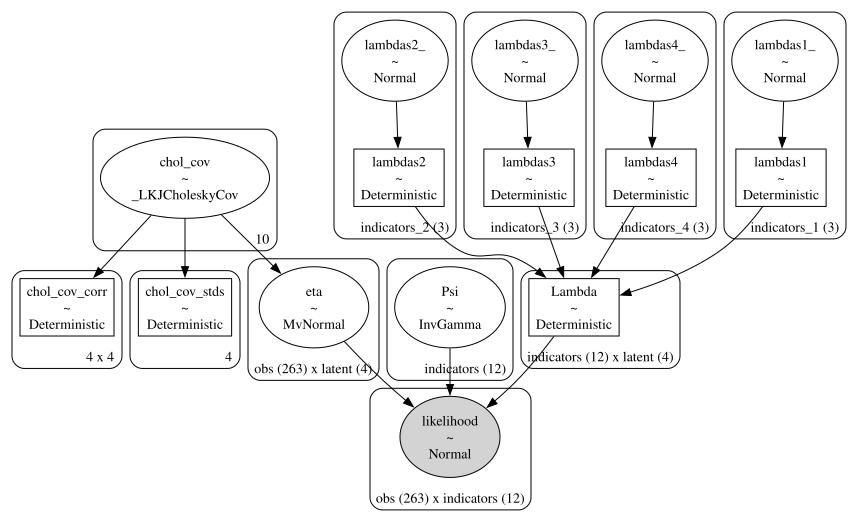

In [6]:
with pm.Model(coords=coords) as cfa_model_v1:

    # --- Factor loadings ---
    lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=[1, 0.5])
    lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=[1, 0.5])
    lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=[1, 0.5])
    lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=[1, 0.5])

    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)
    eta = pm.MvNormal("eta", 0, chol=chol, dims=("obs", "latent"))

    # Construct Pseudo Observation matrix based on Factor Loadings
    mu = pt.dot(eta, Lambda.T)  # (n_obs, n_indicators)

    ## Error Terms
    Psi = pm.InverseGamma("Psi", 5, 10, dims="indicators")
    _ = pm.Normal(
        "likelihood", mu=mu, sigma=Psi, observed=observed_data, dims=("obs", "indicators")
    )

pm.model_to_graphviz(cfa_model_v1)

The model diagram should emphasise how the sampling of the latent structure is fed-forward into the ultimate likelihood term. Note here how our likelihood term is specified as a independent Normals. This is a substantive assumption which is later revised. In a full SEM specification we will change the likelihood to use Multivariate normal distribution with specific covariance structures. 

In Lavaan notation this is the model we are aiming at:

```
# measurement part
CTS =~ EBA + ST + MI
DTP =~ DA1 + DA2 + DA3
SWB =~ UF1 + UF2 + FOR
JS =~ JW1 + JW2 + JW3

```
Where the `=~` symbol denotes the "is measured by" relation. Now we fit the model, to sample from the prior, condition on the likelihood and derive the posterior estimates for the model parameters. 

In [7]:
idata_cfa_model_v1 = sample_model(cfa_model_v1, sampler_kwargs=sampler_kwargs)

Sampling: [Psi, chol_cov, eta, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, eta, Psi]


Output()

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 18 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [likelihood]


Output()

#### A Sampled Lambda Matrix

Let's inspect a sampled $\Lambda$ parameter. Note how each factor (column index) records three positive parameters, while the first of each parameters is fixed to 1. This is to ensure that the scale of the latent factor is well defined - indexed in magnitude to one of the observed metrics.

In [8]:
idata_cfa_model_v1["posterior"]["Lambda"].sel(chain=0, draw=0)

<xarray.DataArray 'Lambda' (indicators: 12, latent: 4)> Size: 384B
array([[1.        , 0.        , 0.        , 0.        ],
       [1.09374011, 0.        , 0.        , 0.        ],
       [1.05741865, 0.        , 0.        , 0.        ],
       [0.        , 1.        , 0.        , 0.        ],
       [0.        , 1.88482908, 0.        , 0.        ],
       [0.        , 0.84676744, 0.        , 0.        ],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.        , 0.99950368, 0.        ],
       [0.        , 0.        , 1.15867591, 0.        ],
       [0.        , 0.        , 0.        , 1.        ],
       [0.        , 0.        , 0.        , 1.17743117],
       [0.        , 0.        , 0.        , 1.57665277]])
Coordinates:
    chain       int64 8B 0
    draw        int64 8B 0
  * latent      (latent) <U13 208B 'satisfaction' ... 'constructive'
  * indicators  (indicators) <U3 144B 'JW1' 'JW2' 'JW3' ... 'EBA' 'ST' 'MI'

### Model Diagnostics and Assessment

The next series of plots are aimed at checking whether the sampler has sufficiently explored the parameter space. 
The difference between the spread of the prior and tightness of the posterior says something of what the model has learned through the process of Bayesian updating. Here both the prior and posterior are centred on 0, and so the learnings can appear "undramatic", but it is often sensible to standardise and scale the the variables before fitting the model. This makes it easier to learn the factor-structure without having to worry about the mean structure since all variables are transformed to centre on 0. 

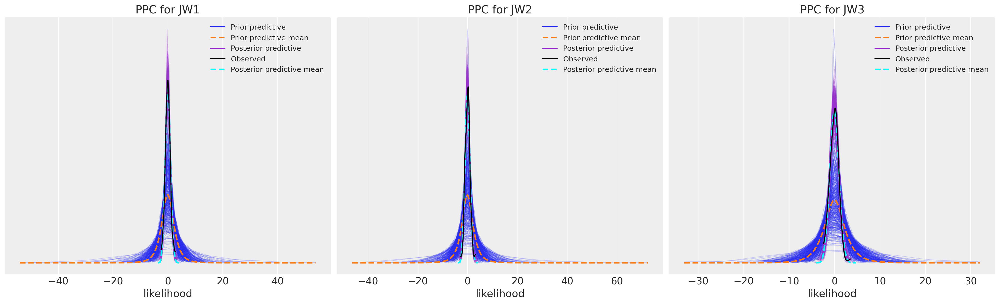

In [9]:
plot_ppc_check(idata_cfa_model_v1, indicators=coords["indicators"][0:3], fitted=True, dims=(1, 3));

Now for each latent variable (satisfaction, well being, constructive, dysfunctional), we will plot a forest/ridge plot of the posterior distributions of their factor scores `eta` as drawn. Each panel will have a vertical reference line at 0 (since latent scores are typically centered/scaled).These panels visualize the distribution of estimated latent scores across individuals. 

Then we summarizes posterior estimates of model parameters (e.g factor loadings, regression coefficients, variances, etc.), providing a quick check against identification constraints (like fixed loadings) and effect directions. 

Finally we will plot the lower-triangle of the residual correlation matrix with a blue–white–red colormap (−1 to +1). This visualizes residuals of the model implied versus true correlations among observed indicators after the SEM structure is accounted for — helping detect model misfit or unexplained associations.

In [10]:
def plot_model_highlights(idata, model_name, parameters, sem=False):
    mosaic = """ABCD
                EEEE
                EEEE
                FFFF"""
    axs = plt.subplot_mosaic(mosaic, figsize=(20, 25))
    axs = axs[1]
    latents = ["satisfaction", "well being", "dysfunctional", "constructive"]

    az.plot_forest(
        idata,
        var_names=["eta"],
        coords={"latent": ["satisfaction"]},
        combined=True,
        ax=axs["A"],
        ridgeplot_alpha=0.5,
        colors="deepskyblue",
    )
    az.plot_forest(
        idata,
        var_names=["eta"],
        coords={"latent": ["well being"]},
        combined=True,
        ax=axs["B"],
        colors="gold",
        ridgeplot_alpha=0.5,
    )
    az.plot_forest(
        idata,
        var_names=["eta"],
        coords={"latent": ["constructive"]},
        combined=True,
        ax=axs["C"],
        colors="lightcoral",
        ridgeplot_alpha=0.5,
    )
    az.plot_forest(
        idata,
        var_names=["eta"],
        coords={"latent": ["dysfunctional"]},
        combined=True,
        ax=axs["D"],
        colors="slateblue",
        ridgeplot_alpha=0.5,
    )
    axs["A"].set_title("Satisfaction")
    axs["B"].set_title("Well Being")
    axs["C"].set_title("Constructive")
    axs["D"].set_title("Dysfunctional")
    axs["A"].axvline(0, color="k")
    axs["B"].axvline(0, color="k")
    axs["C"].axvline(0, color="k")
    axs["D"].axvline(0, color="k")
    axs["A"].set_yticklabels([])
    axs["B"].set_yticklabels([])
    axs["C"].set_yticklabels([])
    axs["D"].set_yticklabels([])
    az.plot_forest(idata, var_names=parameters, combined=True, ax=axs["E"])
    axs["E"].set_title(f"Parameter Estimates for {model_name}")
    axs["E"].axvline(1, color="k", linestyle="--")
    if sem:
        axs["E"].axvline(0, color="k")

    residuals_posterior_corr = get_posterior_resids(idata, 2500, metric="corr")
    mask = np.triu(np.ones_like(residuals_posterior_corr, dtype=bool))
    sns.heatmap(
        residuals_posterior_corr,
        annot=True,
        cmap="bwr",
        mask=mask,
        ax=axs["F"],
        vmin=-1,
        vmax=1,
        cbar=False,
    )
    axs["F"].set_title(f"Residuals for {model_name}")
    plt.suptitle("Latent Scores, Parameters Estimates \n and Performance Measures", fontsize=20)
    fig = plt.gcf()
    return fig

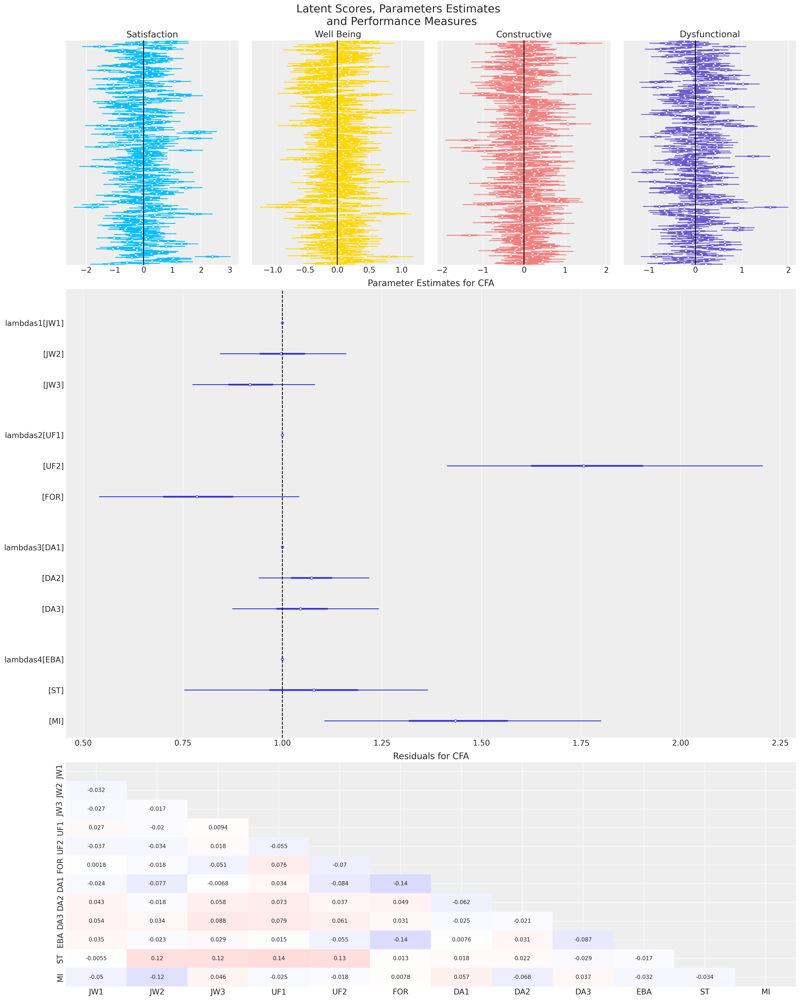

In [11]:
model_name = "CFA"
parameters = ["lambdas1", "lambdas2", "lambdas3", "lambdas4"]

plot_model_highlights(idata_cfa_model_v1, "CFA", parameters);

These plots indicate a fairly promising modelling strategy. The estimated factor Loadings are all close to 1 which implies a conformity in the magnitude and scale of the indicator metrics within each of the four factors.The indicator(s) are strongly reflective of the latent factor although `UF1` and `FOR` seem to be moving in opposite directions. We will want to address this later when we specify covariance structures for the residuals. 

The Posterior Predictive Residuals are close to 0 which suggests that model is well able to capture the latent covariance structure of the observed data. The latent factors move together in intuitive ways, with high Satisfaction ~~ high Well Being. 

Below these model checks we will now plot some diagnostics for the sampler. The energy plots should show overlapping distributions and the effective sample size should hopefully be high across the slew of focal parameters.

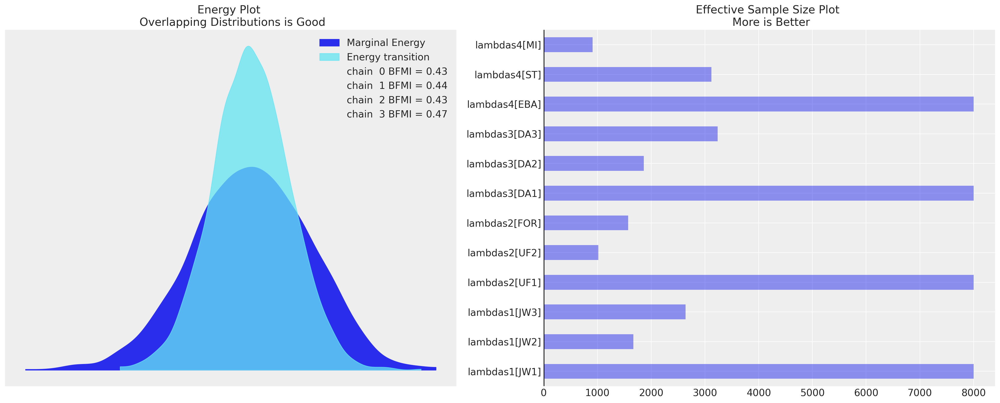

In [12]:
plot_diagnostics(idata_cfa_model_v1, parameters);

The sampler diagnostics give no indication of trouble. This is a promising start. We now shift the SEM setting to layer in Structural regressions. These relations are usually the focus of an analysis. 

## Structuring the Latent Relations

The next expansionary move in SEM modelling is to consider the relations between the latent constructs. These are generally intended to have a causal interpretation. The constructs are hard to measure precisely but collectively (as a function of multiple indicator variables) we argue they are exhaustively characterised. Although each construct is imprecisely measured, together their indicators are assumed to capture the construct’s essential variation. This assumption underpins the causal interpretation of structural paths. 

Bollen argues as follows:

> [...], we cannot isolate a dependent variable from all influences but a single explanatory variable, so it is impossible to make definitive statements about causes. We replace perfect isolation with pseudo-isolation by assuming that the disturbance (i.e., the composite of all omitted determinants) is uncorrelated with the exogenous variables of an equation. - Bollen in _Structural Equations with Latent Variables_ pg45

This is a claim of conditional independence which licenses the causal interpretation of the the arrows in the below plot. The fact that the latent relations operate a higher level of abstraction makes it easier to postulate these "clean" direct paths between constructs. The model makes an argument - to have properly measured the latent constructs, and isolated their variation - to support the causal claim. Criticisms of the model proceed by assessing how compelling these postulates are in the context of the fitted model.

![](sem3_excalidraw.png)

The isolation or conditional independence of interest is encoded in the model with the sampling of the `gamma` variable. These are drawn from a process that is structurally divorced from the influence of the exogenous variables. For instance if we have $\gamma_{cts} \perp\!\!\!\perp \eta_{dtp}$ then the $\beta_{cts -> dpt}$ coefficient is an unbiased estimate of the direct effect of `CTS` on `DTP` because the remaining variation in $\eta_{dtp}$ is noise by construction. 

Each additional arrow in the structural model thus encodes a substantive theoretical claim about causal influence. You are making claims of causal influence. Arrows should be added in line with plausible theory, while parameter identification is well supported. In our case we have structured the DAG following the discussion in {cite:p}`vehkalahti2019multivariate` which will allow us to unpick the direct and indirect effects below. In Lavaan syntax the model we want to specify is: 

```
# measurement part
CTS =~ EBA + ST + MI
DTP =~ DA1 + DA2 + DA3
SWB =~ UF1 + UF2 + FOR
JS =~ JW1 + JW2 + JW3

# structural part
DTP ~ CTS
SWB ~ CTS + DTP
JS  ~ CTS + DTP + SWB 

```

where the `~` denotes a regression relationship. 

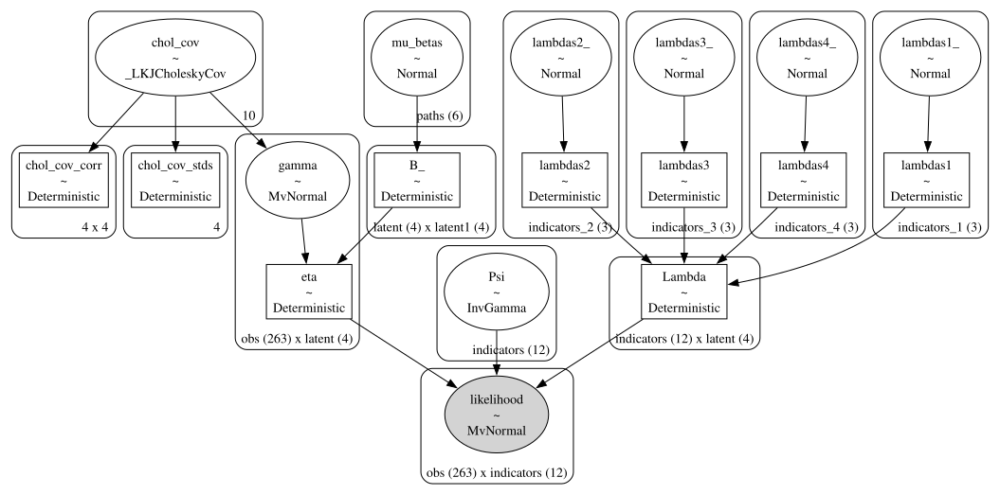

In [13]:
with pm.Model(coords=coords) as sem_model_v1:

    # --- Factor loadings ---
    lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=[1, 0.5])
    lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=[1, 0.5])
    lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=[1, 0.5])
    lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=[1, 0.5])

    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    latent_dim = len(coords["latent"])

    sd_dist = pm.Exponential.dist(1.0, shape=latent_dim)
    chol, _, _ = pm.LKJCholeskyCov(
        "chol_cov", n=latent_dim, eta=2, sd_dist=sd_dist, compute_corr=True
    )
    gamma = pm.MvNormal("gamma", 0, chol=chol, dims=("obs", "latent"))

    B = make_B()
    I = pt.eye(latent_dim)
    ## Clean Causal Influence of Shocks
    eta = pm.Deterministic(
        "eta", pt.slinalg.solve(I - B + 1e-8 * I, gamma.T).T, dims=("obs", "latent")
    )
    ## Influence of Exogenous indicator variables
    mu = pt.dot(eta, Lambda.T)

    ## Error Terms
    sds = pm.InverseGamma("Psi", 5, 10, dims="indicators")
    Psi = pt.diag(sds)
    _ = pm.MvNormal(
        "likelihood", mu=mu, cov=Psi, observed=observed_data, dims=("obs", "indicators")
    )

pm.model_to_graphviz(sem_model_v1)

We have also added the covariance structure on the residuals by supplying a multivariate normal likelihood with a diagonal covariance structure. This is akin to the independent normals we saw in the CFA model, but hints at the extra structure we can (and will) impose on the residuals.

In [14]:
idata_sem_model_v1 = sample_model(sem_model_v1, sampler_kwargs)

Sampling: [Psi, chol_cov, gamma, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, gamma, mu_betas, Psi]


Output()

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 131 seconds.
There were 63 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [likelihood]


Output()

#### A Sampled B Matrix

Now we can sample the B matrix and observe its structure. The sampled $B$ matrix compactly represents the system of regression relationships among latent constructs 

It's best to see the matrix as encoding target variables in the columns and predictor variables in the rows. Here we have the set up our matrix so that `satisfaction` is predicted by three variables, but not itself. The values in the first column are sampled coefficient values in the regression: 

$$ \eta_{sat} \sim B_{1, 0}\eta_{well} + B_{2, 0}\eta_{dys} +  B_{3, 0}\eta_{con}$$

where we've used pythonic indexing of the matrix. Note how values of $\eta$ appear on both sides of the equation. We are solving a system of equations simultaneously i.e. we need to solve for $\eta = B\eta $ where values of $\eta_{i}$ appear on both sides. Solving the matrix untangles the mess of simultaneous equations, but also allows us to derive to total, direct and indirect effects of each latent factor across all the pathways of the system. 


In [15]:
idata_sem_model_v1["posterior"]["B_"].sel(chain=0, draw=0)

<xarray.DataArray 'B_' (latent: 4, latent1: 4)> Size: 128B
array([[ 0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.22744438,  0.        ,  0.        ,  0.        ],
       [-0.1362687 , -0.13285931,  0.        ,  0.        ],
       [-0.02196507, -0.43435932,  0.31533383,  0.        ]])
Coordinates:
    chain    int64 8B 0
    draw     int64 8B 0
  * latent   (latent) <U13 208B 'satisfaction' 'well being' ... 'constructive'
  * latent1  (latent1) <U13 208B 'satisfaction' 'well being' ... 'constructive'

This compact representation of three separate regressions equations is used to sort out the mutual influences, interactions and distortions our habits of thought have on our job satisfaction. It's true that the relationships between these latent constructs need not be linear and simplistic. There may be messy non-linear relationships between satisfaction and well being, but we are a deliberately abstracting some of that away in favour of a tractable, quantifiable measure of linear effect. This is often a simplification, but parsimony is also a goal of the modelling process.   

### Model Diagnostics and Assessment

Let's examine our model sense checks. The posterior predictive distributions retain a healthy appearence. Our prior allowed for a wide-realisation of values, and yet the posterior has a shrunk the range considerably closer to the standardised 0-mean data. 

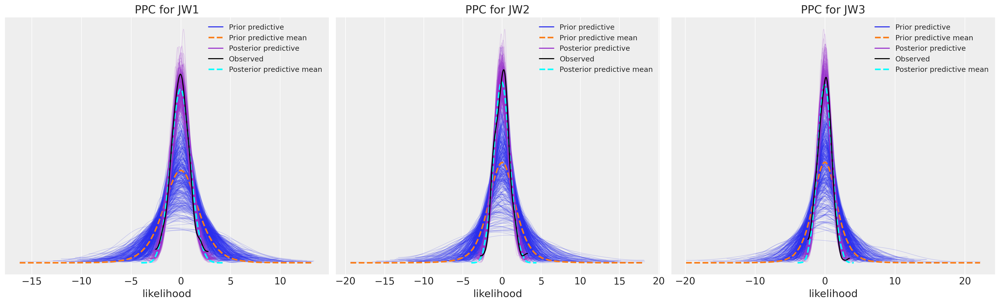

In [16]:
plot_ppc_check(idata_sem_model_v1, indicators=coords["indicators"][0:3], fitted=True, dims=(1, 3));

The derived covariance structures show improvement on the model implied residuals. Additionally we now get insight into the implied paths and relationships between the latent constructs. These move in compelling ways. Dysfunctional thought processes have a probable negative impact on well being, and similarly for job satisfaction. Conversely constructive thought processes have a probable positive direct effect on well being and satisfaction. Although the latter appears slight. 

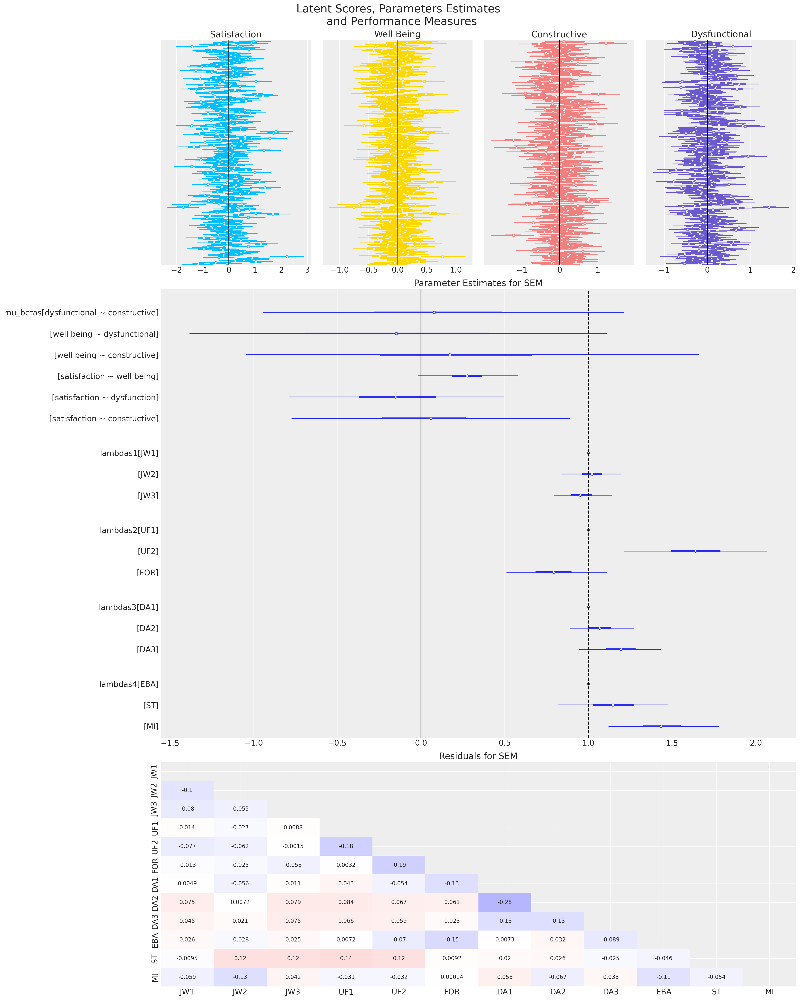

In [17]:
parameters = ["mu_betas", "lambdas1", "lambdas2", "lambdas3", "lambdas4"]
plot_model_highlights(idata_sem_model_v1, "SEM", parameters, sem=True);

However, the model diagnostics appear less robust. The sampler seemed to have difficulty with sampling the parameters for the path-coefficients `mu_betas`. 

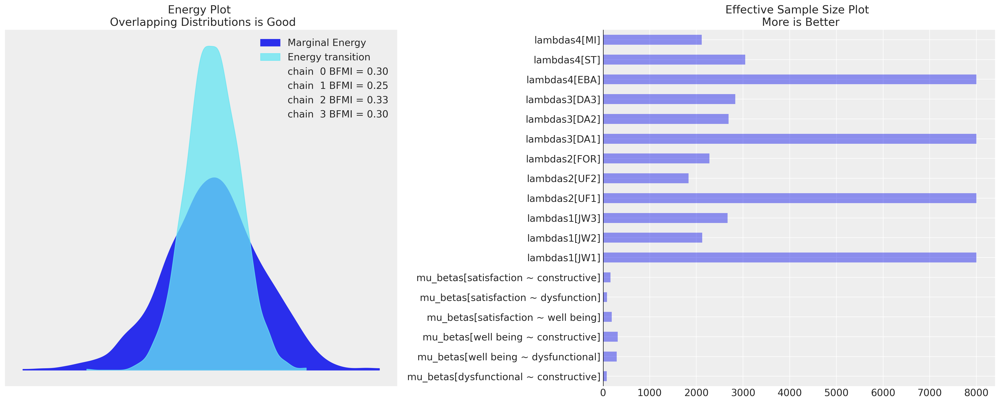

In [18]:
plot_diagnostics(idata_sem_model_v1, parameters);

The sampler diagnostics suggest that the model is having trouble samplng from the B matrix. This is a little concerning because the structural relations are the primary parameters of interest in the SEM setting. Anything which undercuts our confidence in their estimation, undermines the whole modelling exercise. Because the conditional SEM showed sampler challenges on `mu_betas`, we now try a marginal formulation.

## Marginal Formulation of the Likelihood

In the next model we focus on the covariance matrix implied by the model rather than conditional regressions. We still use the B matrix, but the role it plays differs slightly. This approach cuts down on the burden for the sampler, by removing the need to parameterise $\eta$ directly. Instead B is used to generate the system's covariance structure and regression like effects are derived as a result. Additionally, we add specific covariance structure to the residuals. In the Lavaan Syntax we have: 

```
# measurement part
CTS =~ EBA + ST + MI
DTP =~ DA1 + DA2 + DA3
SWB =~ UF1 + UF2 + FOR
JS =~ JW1 + JW2 + JW3

# error covariance
UF1 ~~ FOR

# structural part
DTP ~ CTS
SWB ~ CTS + DTP
JS  ~ CTS + DTP + SWB 

```



where we have finally added structure to the residuals of the multivariate normal outcome by imposing a non-zero covariance relation between `UF1` and `FOR`.

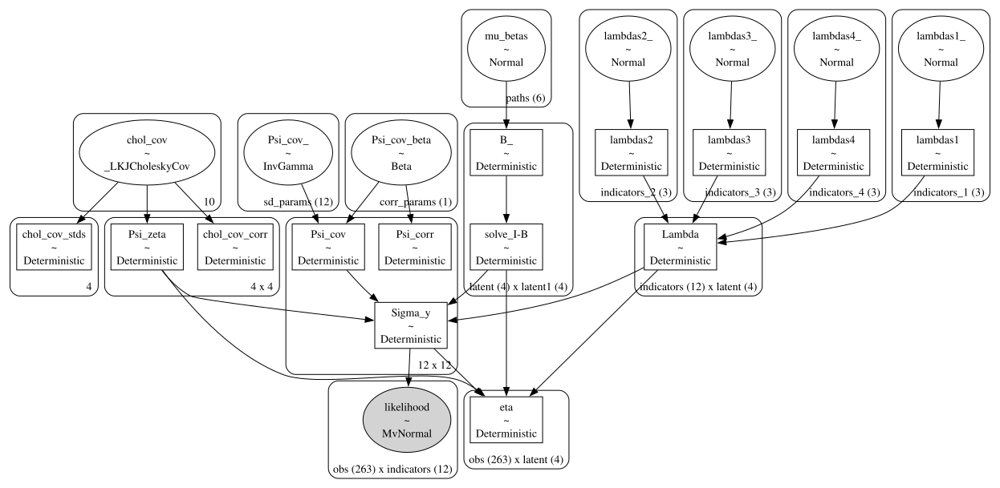

In [19]:
with pm.Model(coords=coords) as sem_model_v2:

    # --- Factor loadings ---
    lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=[1, 0.5])
    lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=[1, 0.5])
    lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=[1, 0.5])
    lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=[1, 0.5])

    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

    Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
    Psi = make_Psi("indicators")

    B = make_B()
    latent_dim = len(coords["latent"])
    I = pt.eye(latent_dim)
    lhs = I - B + 1e-8 * pt.eye(latent_dim)  # (latent_dim, latent_dim)
    inv_lhs = pm.Deterministic(
        "solve_I-B", pt.slinalg.solve(lhs, pt.eye(latent_dim)), dims=("latent", "latent1")
    )

    Sigma_y = pm.Deterministic(
        "Sigma_y",
        Lambda.dot(inv_lhs).dot(Psi_zeta).dot(inv_lhs.T).dot(Lambda.T) + Psi,
    )
    ## Eta is predicted not sampled!
    M = Psi_zeta @ inv_lhs @ Lambda.T @ pm.math.matrix_inverse(Sigma_y)
    eta_hat = pm.Deterministic("eta", (M @ (observed_data - 0).T).T, dims=("obs", "latent"))
    _ = pm.MvNormal(
        "likelihood", mu=0, cov=Sigma_y, observed=observed_data, dims=("obs", "indicators")
    )

pm.model_to_graphviz(sem_model_v2)

In [20]:
idata_sem_model_v2 = sample_model(sem_model_v2, sampler_kwargs)

Sampling: [Psi_cov_, Psi_cov_beta, chol_cov, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, Psi_cov_, Psi_cov_beta, mu_betas]


Output()

Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 85 seconds.
There were 20 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [likelihood]


Output()

### Model Diagnostics and Assessment

Note here how the prior range supasses the previous posterior predictive checks. The model is exploring a much wider potential outcome space, but still neatly resolves to a 0-mean system after updating the posterior.

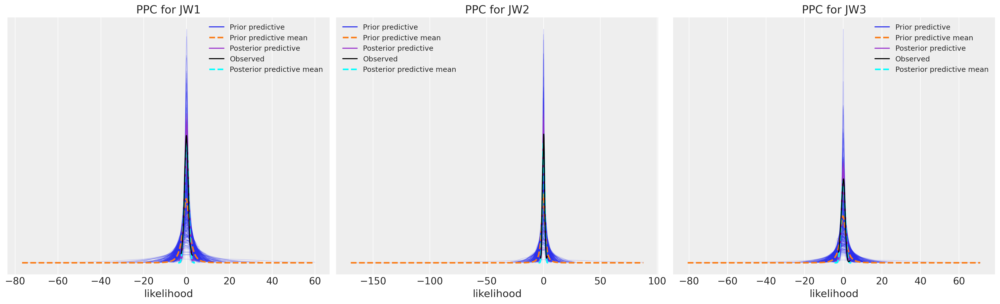

In [21]:
plot_ppc_check(idata_sem_model_v2, indicators=coords["indicators"][0:3], fitted=True, dims=(1, 3));

The parameter estimates and other model health metrics seem in line with the covariance structure observed in the confirmatory factor model which suggests that even with our extra parameterisation we retain fidelty to the data generating process. 

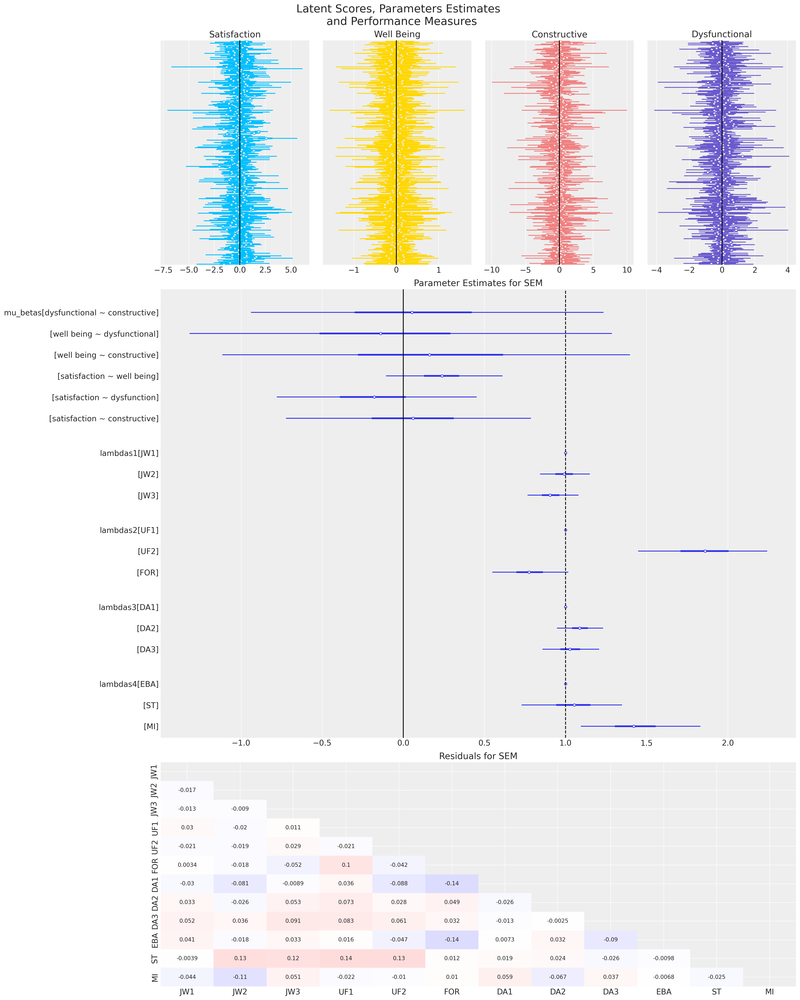

In [22]:
parameters = ["mu_betas", "lambdas1", "lambdas2", "lambdas3", "lambdas4"]
plot_model_highlights(idata_sem_model_v2, "SEM", parameters, sem=True);

However, now the sampler health looks much, much better. Marginalising the likelihood seems to have considerable improved the sampling diagnostics. 

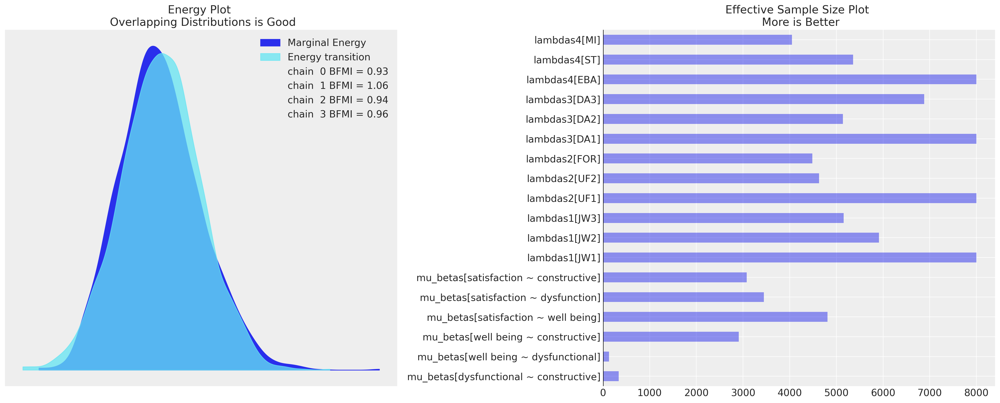

In [23]:
plot_diagnostics(idata_sem_model_v2, parameters);

## Mean Structure SEM

Let's add a bit more structure and push this sampling strategy. Here we've allowed the the mean realisation of the the indicator variables can vary. The $\mu$ parameter of our likelihood needs to reflect this assumption to better capture the structure of the data. This is useful when believe there are baseline differences across groups in the data or you want to compare the mean-differences across two populations.

In [24]:
sample_df_mean = make_sample(cov_matrix, 263, FEATURE_COLUMNS, mean_structure=True)
pd.DataFrame(sample_df_mean.mean()).T

,JW1,JW2,JW3,UF1,UF2,FOR,DA1,DA2,DA3,EBA,ST,MI
0,-0.890247,0.389706,-0.418352,-0.492313,3.070041,-0.775086,1.962447,4.7989,-3.886689,-4.78091,-2.283988,1.047447


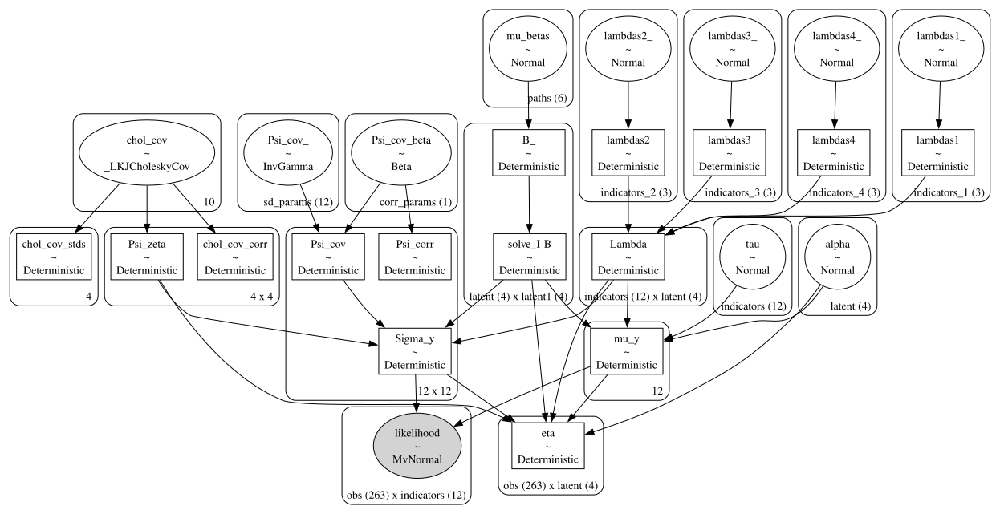

In [25]:
obs_idx = list(range(len(sample_df_mean)))
observed_data = sample_df_mean[coords["indicators"]].values
coords["obs"] = range(len(sample_df_mean))

with pm.Model(coords=coords) as sem_model_mean_structure:

    # --- Factor loadings ---
    lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=[1, 0.5])
    lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=[1, 0.5])
    lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=[1, 0.5])
    lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=[1, 0.5])
    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

    Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
    Psi = make_Psi("indicators")

    B = make_B()
    latent_dim = len(coords["latent"])
    I = pt.eye(latent_dim)
    lhs = I - B + 1e-8 * pt.eye(latent_dim)  # (latent_dim, latent_dim)
    inv_lhs = pm.Deterministic(
        "solve_I-B", pt.slinalg.solve(lhs, pt.eye(latent_dim)), dims=("latent", "latent1")
    )

    # Mean Structure
    tau = pm.Normal("tau", mu=0, sigma=5, dims="indicators")  # observed intercepts
    alpha = pm.Normal("alpha", mu=0, sigma=0.5, dims="latent")  # latent means
    mu_y = pm.Deterministic("mu_y", tau + pt.dot(Lambda, pt.dot(inv_lhs, alpha)))

    Sigma_y = pm.Deterministic(
        "Sigma_y", Lambda.dot(inv_lhs).dot(Psi_zeta).dot(inv_lhs.T).dot(Lambda.T) + Psi
    )
    M = Psi_zeta @ inv_lhs @ Lambda.T @ pm.math.matrix_inverse(Sigma_y)
    eta_hat = pm.Deterministic(
        "eta", alpha + (M @ (observed_data - mu_y).T).T, dims=("obs", "latent")
    )
    _ = pm.MvNormal(
        "likelihood", mu=mu_y, cov=Sigma_y, observed=observed_data, dims=("obs", "indicators")
    )

pm.model_to_graphviz(sem_model_mean_structure)

In [26]:
sampler_kwargs = {"tune": 2000, "draws": 1000, "nuts_sampler": "numpyro"}
idata_sem_model_v3 = sample_model(sem_model_mean_structure, sampler_kwargs)

Sampling: [Psi_cov_, Psi_cov_beta, alpha, chol_cov, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas, tau]


  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Sampling: [likelihood]


Output()

### Model Diagnostics and Assessment

We can now see how the prior draws vary more explicitly around 0 seeking the mean realisation of each outcome variable. We've asked the model to learn "more" structure and it naturally explores more of the parameter space to evaluate comparable likelihoods. 

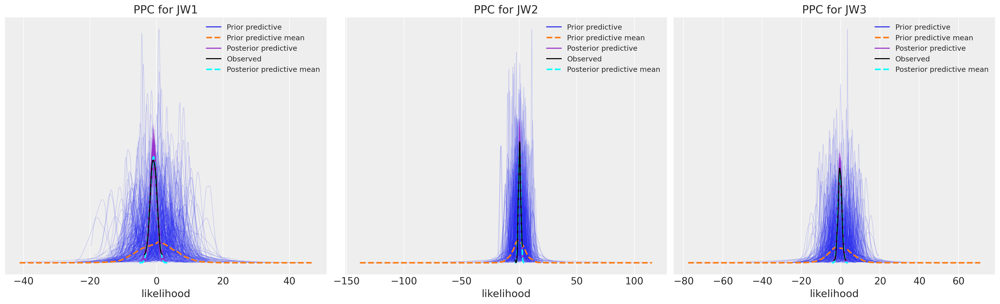

In [27]:
plot_ppc_check(idata_sem_model_v3, indicators=coords["indicators"][0:3], fitted=True, dims=(1, 3));

We can now assess the `tau` parameters to see where the model locates the mean realisation of each indicator variable. 

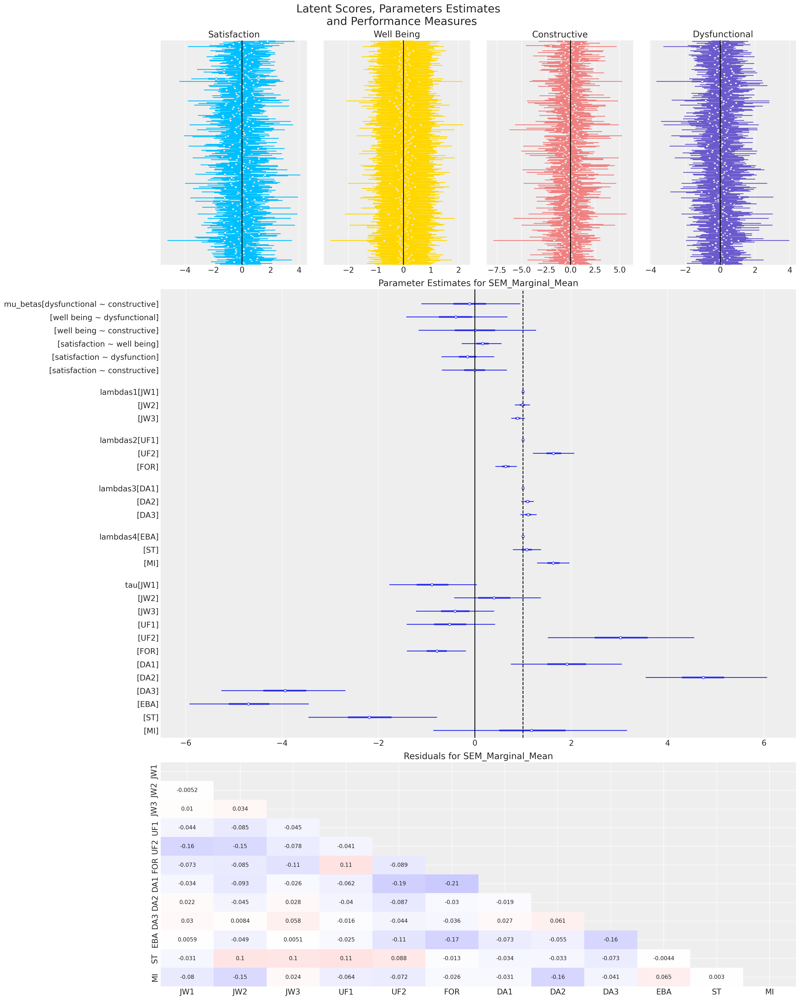

In [28]:
parameters = ["mu_betas", "lambdas1", "lambdas2", "lambdas3", "lambdas4", "tau"]
plot_model_highlights(idata_sem_model_v3, "SEM_Marginal_Mean", parameters, sem=True);

The posterior predictive distribution of the model implied residuals seems comparable to the cases above, but this time we've also isolated the mean structure. 

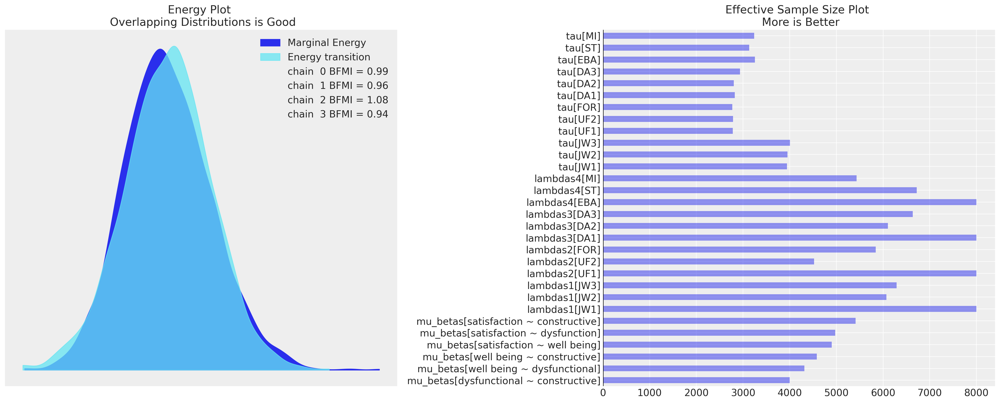

In [29]:
plot_diagnostics(idata_sem_model_v3, parameters);

The sampler diagnostics also seem healthy.

We can also pull out the indirect and direct effects. This is one of the biggest pay-offs for SEM modelling. We've done the work of assessing measurement error and building an abstraction layer of __what-we-care-about__ over the observed indicators. We've considered various structures of the inferential relationships and isolated those direct effects from undue confounding influences. Now we can pull out the impact of mediation and moderation.

## Sensitivity Analysis: Comparing Model Implications

Let's first compare the model implied total effects, and the degrees of moderation between constructive and dysfunctional habits of thought on the satisfaction outcome.

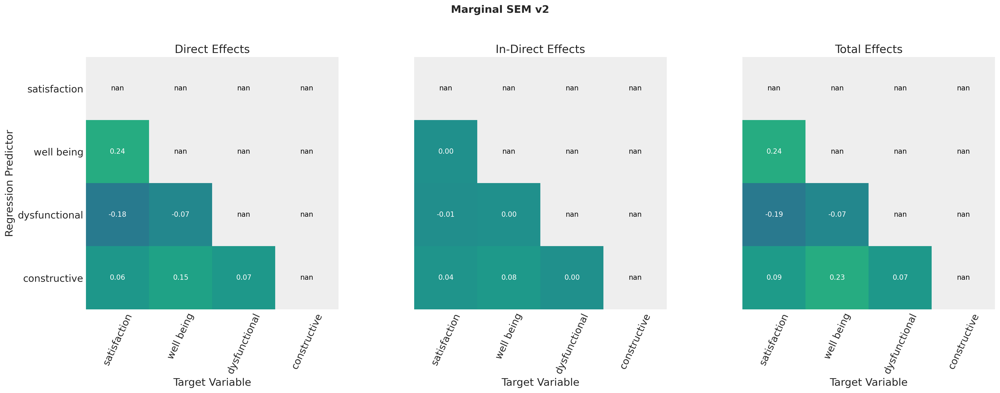

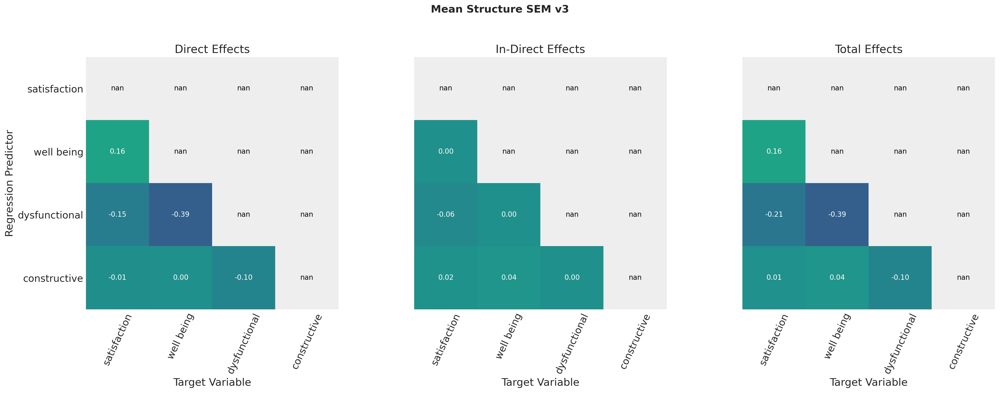

In [30]:
def plot_heatmap(
    data,
    title="Correlation Matrix",
    vmin=-0.2,
    vmax=0.2,
    ax=None,
    figsize=(10, 6),
    colorbar=True,
    cmap="magma",
):
    data_matrix = data.values
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)

    for i in range(data_matrix.shape[0]):
        for j in range(data_matrix.shape[1]):
            text = ax.text(
                j,
                i,  # x, y coordinates
                f"{data_matrix[i, j]:.2f}",  # text to display
                ha="center",
                va="center",  # center alignment
                color="white" if data_matrix[i, j] < 0.5 else "black",  # contrast color
            )

    ax.set_title(title)
    ax.set_xticklabels(data.columns)
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticklabels(data.index)
    ax.set_yticks(np.arange(data.shape[0]))
    if colorbar:
        plt.colorbar(im)


def plot_total_effects(idata, title):
    fig, axs = plt.subplots(1, 3, figsize=(20, 8))
    axs = axs.flatten()

    total_effect = az.summary(idata, var_names=["solve_I-B"])["mean"].values.reshape((4, 4))

    direct_effect = az.summary(idata, var_names=["B_"])["mean"].values.reshape((4, 4))

    i, j = np.triu_indices(total_effect.reshape((4, 4)).shape[0])
    total_effect[i, j] = np.nan
    direct_effect[i, j] = np.nan

    indirect_effect = total_effect - direct_effect

    plot_heatmap(
        pd.DataFrame(direct_effect, columns=coords["latent"], index=coords["latent"]),
        ax=axs[0],
        vmax=1,
        vmin=-1,
        colorbar=False,
        title="Direct Effects",
        cmap="viridis",
    )
    plt.tight_layout()
    axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=65)
    axs[0].set_xlabel("Target Variable")
    axs[0].set_ylabel("Regression Predictor")

    plot_heatmap(
        pd.DataFrame(indirect_effect, columns=coords["latent"], index=coords["latent"]),
        ax=axs[1],
        vmax=1,
        vmin=-1,
        colorbar=False,
        title="In-Direct Effects",
        cmap="viridis",
    )
    plt.tight_layout()
    axs[1].set_yticklabels([])
    axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=65)
    axs[1].set_xlabel("Target Variable")

    plot_heatmap(
        pd.DataFrame(
            total_effect.reshape((4, 4)), columns=coords["latent"], index=coords["latent"]
        ),
        ax=axs[2],
        vmax=1,
        vmin=-1,
        colorbar=False,
        title="Total Effects",
        cmap="viridis",
    )
    plt.tight_layout()
    axs[2].set_yticklabels([])
    axs[2].set_xticklabels(axs[2].get_xticklabels(), rotation=65)
    axs[2].set_xlabel("Target Variable")

    axs[0].grid(False)
    axs[1].grid(False)
    axs[2].grid(False)
    plt.suptitle(title, fontsize=15, fontweight="bold")


plot_total_effects(idata_sem_model_v2, "Marginal SEM v2")

plot_total_effects(idata_sem_model_v3, "Mean Structure SEM v3")

Even though constructive thought processes have a directly positive effect on job satisfaction, we can see that when they are paired with dysfunctional thought processes the positive effects are moderated. __Note to all employers__: well-being and general welfare is seen as the most substantively positive predictor of job satisfaction. Fix your process certainly, improve your workflows, encourage constructive practices and dialogues, but it's hard to beat a secure welfare and fair compensation when aiming to improve work satisfaction. 


We'll also pull together the model implied residuals on the correlation coefficients. This will help us see how whether our different model structures are consistently deriving similar stories about the data generating relationships. 

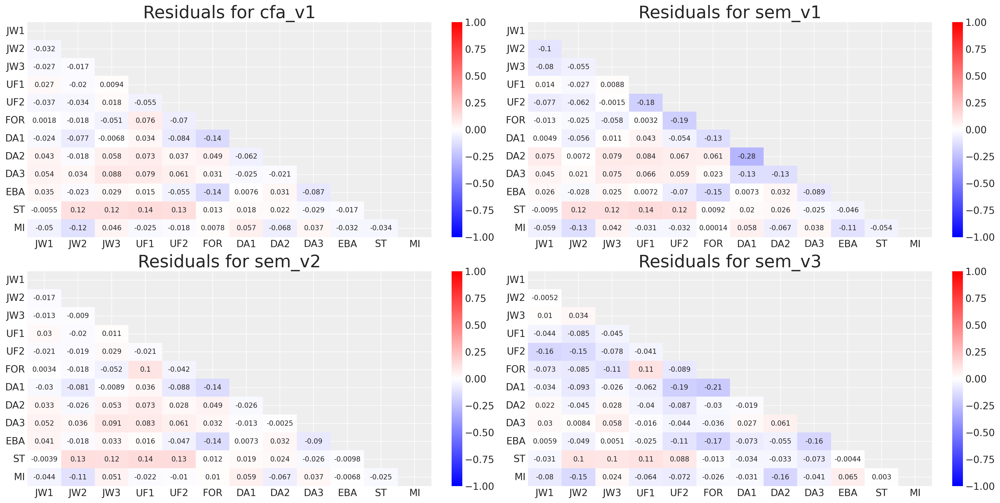

In [31]:
import seaborn as sns

idatas = [idata_cfa_model_v1, idata_sem_model_v1, idata_sem_model_v2, idata_sem_model_v3]
model_names = ["cfa_v1", "sem_v1", "sem_v2", "sem_v3"]


fig, axs = plt.subplots(2, 2, figsize=(20, 10))
axs = axs.flatten()
for idata, model_name, ax in zip(idatas, model_names, axs):
    residuals_posterior_corr = get_posterior_resids(idata, 2500, metric="corr")
    mask = np.triu(np.ones_like(residuals_posterior_corr, dtype=bool))
    sns.heatmap(residuals_posterior_corr, annot=True, cmap="bwr", mask=mask, ax=ax, vmin=-1, vmax=1)
    ax.set_title(f"Residuals for {model_name}", fontsize=25);

We see similar residuals for all models except a degradation as the model tries to account for the novel mean-structured data. This could be attributed to the greater complexity of the parameter space with the same amount of data, or an idiosyncracy of the sampling process. 

Below we can see that the models are substantially similar in key dimensions; the magnitude and direction of the implied effects are similar across each model. This is an important observation. It is this kind of robustness to model specification that we want to see in this kind of iterative modelling. This should give us confidence that the model is well specified and picking up on the actual relationships between these latent constructs. 

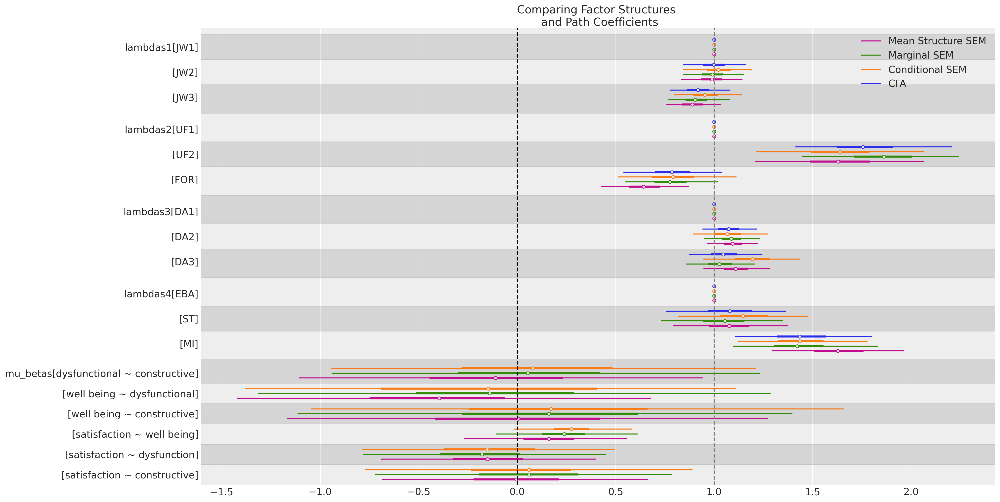

In [32]:
ax = az.plot_forest(
    [idata_cfa_model_v1, idata_sem_model_v1, idata_sem_model_v2, idata_sem_model_v3],
    model_names=["CFA", "Conditional SEM", "Marginal SEM", "Mean Structure SEM"],
    var_names=["lambdas1", "lambdas2", "lambdas3", "lambdas4", "mu_betas"],
    combined=True,
    figsize=(20, 10),
)

ax[0].axvline(0, linestyle="--", color="k")
ax[0].axvline(1, linestyle="--", color="grey")
ax[0].set_title("Comparing Factor Structures \n and Path Coefficients");

We can also derive global estimates of model fit such as the leave-one-out cross validation (LOO) scores. These should be seen as additional data points along side the more local measures of model fit we can see in the residual plots. These scores highlight an interesting distinction between the marginal and conditional formulations of a SEM model. 

In [33]:
loo_df = pd.concat(
    {
        "CFA_CONDITIONAL": pd.DataFrame(az.loo(idata_cfa_model_v1)).T,
        "SEM_CONDITIONAL": pd.DataFrame(az.loo(idata_sem_model_v1)).T,
        "SEM_MARGINAL": pd.DataFrame(az.loo(idata_sem_model_v2)).T,
        "SEM_MEAN_STRUCTURE_MARGINAL": pd.DataFrame(az.loo(idata_sem_model_v3)).T,
    }
)

loo_df[["elpd_loo", "se", "p_loo", "n_samples", "n_data_points"]]

,,elpd_loo,se,p_loo,n_samples,n_data_points
CFA_CONDITIONAL,0,-2806.083171,39.698899,683.100133,4000,3156
SEM_CONDITIONAL,0,-3059.374763,30.937284,578.201768,4000,263
SEM_MARGINAL,0,-3128.408587,39.833064,28.802125,4000,263
SEM_MEAN_STRUCTURE_MARGINAL,0,-3207.203442,41.846965,40.065727,4000,263


The conditional model formulas show a lower and therefore better performance. This is typical because the conditional formulation is forced to use a conditional calculation making use of the sampled `eta`. In short we're using a probability

$$ p(y | \eta, \theta)$$

whereas the marginal formulation does not make use of `eta` in the likelihood calculation. 

$$ p(y | \theta)$$ 

As such, we're comparing apples and oranges when we try and compare marginal and conditional SEMs on their LOO scores. The interpretive gloss here is that it's better to see the conditional performance metric as a score for reconstruction error. While the marginal scores can be seen as proper proxies for out-of-sample predictions error. They are both useful measures but represent slightly different performance measures. This is an easy detail to miss when you're naively chasing performance benchmarks. When selecting models with metric optimisation in mind, we need to understand what we're actually optimising.  

In this case we can see that the SEM structure does seem to improve on the CFA model. But that the mean structure model doesn't improve on the baseline marginal structure. Coupled with the comparability of the Residual errors, we can compellingly claim that the Marginal SEM model is the preferred model. It recovers the plausible posterior predictive statistics and does so with reasonably parsimony. It is coherent with insights from the other moodel but improves on them in a range of ways, from computational efficiency to preferable performance measures. 

These kinds of sensitivity analysis help with model validation, but we can be even more clinical in our assessment of these models. We can perform parameter recovery exercises to properly validate that our model specification can identify the structural parameters of our complex SEM architecture. 

## Hierarchical Model on Structural Components

The mean-structure SEM provides a baseline description of how latent factors generate observed indicators. In real applications, however, we often expect these relationships to differ across groups or conditions. A hierarchical extension allows us to model those differences directly—testing whether the structural paths encoded in `B` are invariant across groups. For example, employees differ by team, firm, or treatment condition. The next natural question in a Bayesian workflow is therefore not just “What are the structural relations?” but “How stable are they across contexts?” This represents a key step in the Bayesian workflow: expanding the model’s expressive power while checking how robust its assumptions remain.

![](hierarchical_excalidraw.png)

Let's assume we are aiming to assess a causal difference between treatment and control groups.

In [34]:
grp_idx = np.random.binomial(1, 0.5, 250)
coords["group"] = ["treatment", "control"]
coords["obs"] = list(range(len(grp_idx)))
coords.keys()

dict_keys(['obs', 'indicators', 'indicators_1', 'indicators_2', 'indicators_3', 'indicators_4', 'latent', 'latent1', 'paths', 'sd_params', 'corr_params', 'group'])

We're now going to add hierarchical structure to the `B` coefficients and feed these through the likelihood term to infer how the structural coefficients respond to group differences. 

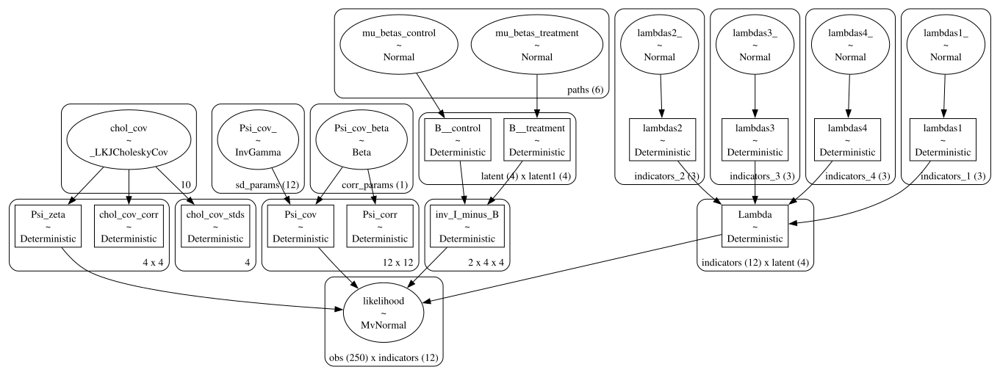

In [35]:
def make_hierarchical(priors, grp_idx):
    with pm.Model(coords=coords) as sem_model_hierarchical:

        # --- Factor loadings ---
        lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=priors["lambdas"])
        lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=priors["lambdas"])
        lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=priors["lambdas"])
        lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=priors["lambdas"])

        Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

        sd_dist = pm.Exponential.dist(1.0, shape=4)
        chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

        Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
        Psi = make_Psi("indicators")

        Bs = []
        for g in coords["group"]:
            B_g = make_B(group_suffix=f"_{g}", priors=priors["B"])  # give group-specific names
            Bs.append(B_g)
        B_ = pt.stack(Bs)

        latent_dim = len(coords["latent"])
        I = pt.eye(latent_dim)

        # invert (I - B_g) for each group
        inv_I_minus_B = pm.Deterministic(
            "inv_I_minus_B",
            pt.stack(
                [pt.slinalg.solve(I - B_[g] + 1e-8 * I, I) for g in range(len(coords["group"]))]
            ),
        )

        Sigma_y = []
        for g in range(len(coords["group"])):
            inv_lhs = inv_I_minus_B[g]
            Sigma_y_g = Lambda @ inv_lhs @ Psi_zeta @ inv_lhs.T @ Lambda.T + Psi
            Sigma_y.append(Sigma_y_g)
        Sigma_y = pt.stack(Sigma_y)
        _ = pm.MvNormal("likelihood", mu=0, cov=Sigma_y[grp_idx], dims=("obs", "indicators"))

    return sem_model_hierarchical


priors = {"lambdas": [1, 0.5], "eta": 2, "B": [0, 0.5], "tau": [0, 1]}

priors_wide = {"lambdas": [1, 5], "eta": 2, "B": [0, 5], "tau": [0, 5]}

sem_model_hierarchical_tight = make_hierarchical(priors, grp_idx)
sem_model_hierarchical_wide = make_hierarchical(priors_wide, grp_idx)

pm.model_to_graphviz(sem_model_hierarchical_tight)

Notice that we haven’t yet provided any observed data to the model — this is intentional. Our next step is to simulate data by performing a forward pass through the system. We initialize two versions of the model: (1) with tight priors and (2) with wide priors on the data-generating parameters. We’ll sample from the tightly parameterized model to generate indicator data consistent with our chosen parameter settings.

In [36]:
# Generating data from model by fixing parameters
fixed_parameters = {
    "mu_betas_treatment": [0.1, 0.5, 2.3, 0.9, -2.0, 0.8],
    "mu_betas_control": [3, 0.2, 0.7, 0.8, 0.6, 1.2],
    "lambdas1_": [1.0, 0.8, 0.9],
    "lambdas2_": [1.0, 0.9, 1.2],
    "lambdas3_": [1.0, 0.95, 0.8],
    "lambdas4_": [1.0, 1.4, 1.1],
    "chol_cov": [0.696, -0.096, 0.23, -0.3, -0.385, 0.398, -0.004, 0.043, -0.037, 0.422],
    "Psi_cov_": [0.559, 0.603, 0.666, 0.483, 0.53, 0.402, 0.35, 0.28, 0.498, 0.494, 0.976, 0.742],
    "Psi_cov_beta": [0.029],
}
with pm.do(sem_model_hierarchical_tight, fixed_parameters) as synthetic_model:
    idata = pm.sample_prior_predictive(
        random_seed=1000,
    )  # Sample from prior predictive distribution.
    synthetic_y = idata["prior"]["likelihood"].sel(draw=0, chain=0)

Sampling: [likelihood]


This has generated synthetic observations spawned from the SEM system we have just set up.

In [37]:
synthetic_y

<xarray.DataArray 'likelihood' (obs: 250, indicators: 12)> Size: 24kB
array([[-1.10677933, -0.07602813, -1.4691509 , ..., -1.5451872 ,
        -3.20136317, -2.35509024],
       [-0.1060998 , -0.47703544, -0.65370513, ..., -0.83395615,
        -0.91467223, -1.19582425],
       [-0.28467305, -0.71004953, -0.14445993, ...,  2.01047007,
         3.78450212,  1.43112998],
       ...,
       [-1.36167324, -1.52224945,  0.15573313, ..., -3.94628572,
        -5.66857144, -4.10187138],
       [-0.49950038, -0.16313664,  1.50717475, ...,  2.40360766,
         2.43653168,  2.99573839],
       [-0.66144055,  0.72552181,  0.0100888 , ..., -0.22279538,
        -1.83857913,  1.09157293]])
Coordinates:
    chain       int64 8B 0
    draw        int64 8B 0
  * obs         (obs) int64 2kB 0 1 2 3 4 5 6 7 ... 243 244 245 246 247 248 249
  * indicators  (indicators) <U3 144B 'JW1' 'JW2' 'JW3' ... 'EBA' 'ST' 'MI'

We now want to see if we can infer the parameters used to generate the data from the `synthetic_y`. To do so, we use the wide-parameterisation of the model, this is more realistic in that we likely don't know the true range of the priors when we come to real world data.

In [38]:
# Infer parameters conditioned on observed data
with pm.observe(sem_model_hierarchical_wide, {"likelihood": synthetic_y}) as inference_model:
    idata_hierarchical = pm.sample_prior_predictive()
    idata_hierarchical.extend(
        pm.sample(random_seed=100, nuts_sampler="numpyro", chains=4, draws=500, tune=2000)
    )

Sampling: [Psi_cov_, Psi_cov_beta, chol_cov, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas_control, mu_betas_treatment]


  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


The model samples well and gives good evidence of distinct posterior distributions across the parameters suggesting the model is capable of identification. 

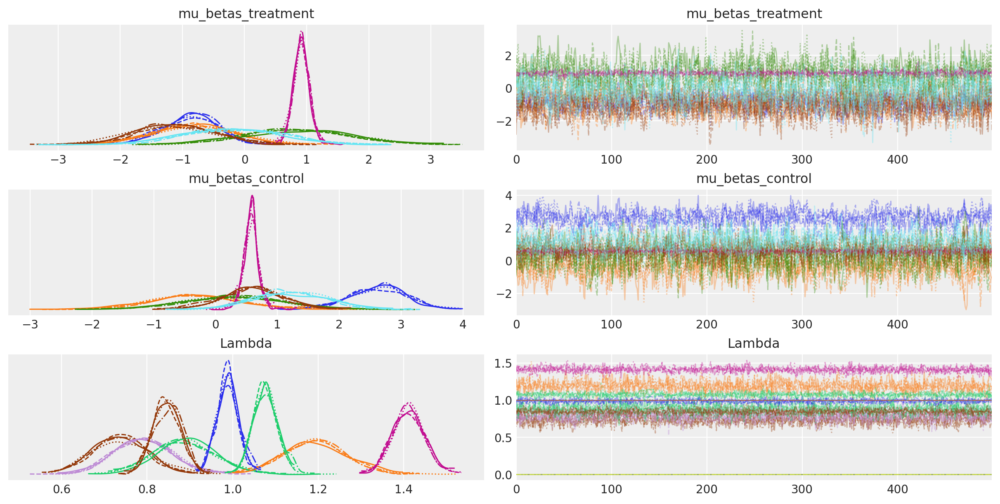

In [39]:
az.plot_trace(idata_hierarchical, var_names=["mu_betas_treatment", "mu_betas_control", "Lambda"]);

#### The Parameter Recovery Process

With this set up we can actually assess the degree of parameter recovery because we know the true values. This is a pivotal part of the model building process, akin to how writer's read aloud their own work to test it for assonance, cogency and flow. In simulation based probabilistic modelling we are able generate data from models with known parameters, and recover the latent parameter values through the inferential workflow. We see how our model performs, much a like how a writer must test if their audience truly grasps their intended message.

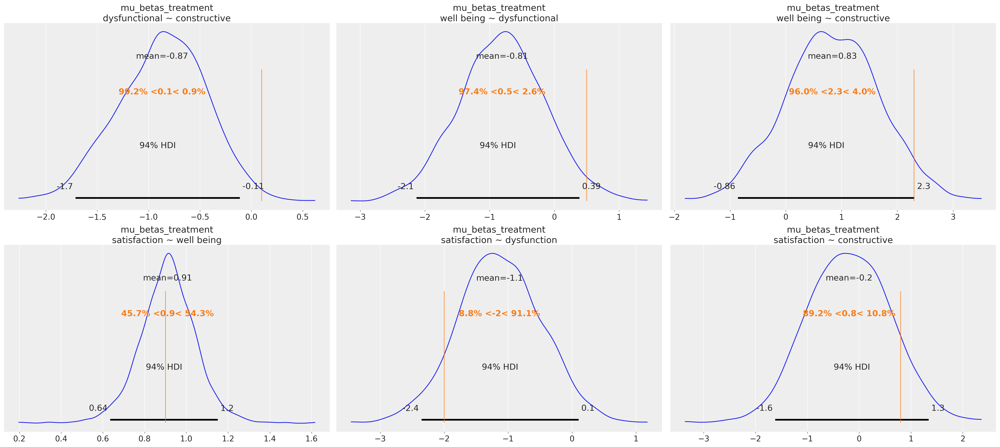

In [40]:
az.plot_posterior(
    idata_hierarchical,
    var_names=["mu_betas_treatment"],
    ref_val=fixed_parameters["mu_betas_treatment"],
);

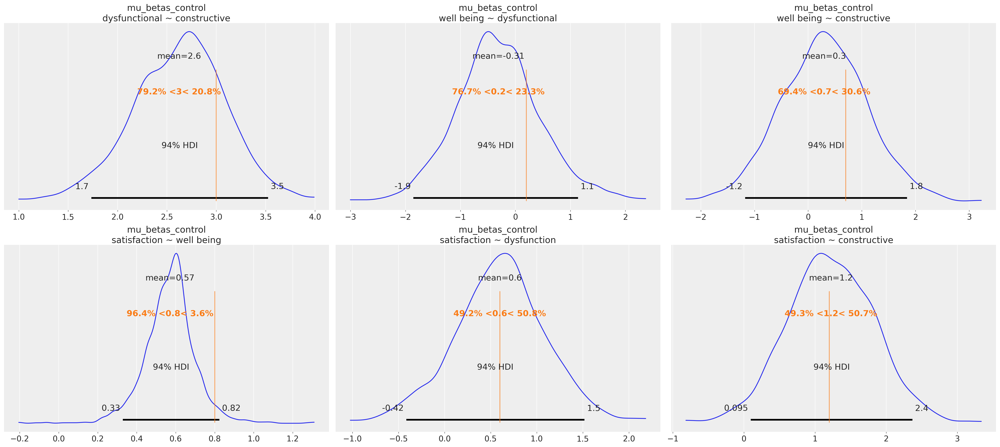

In [41]:
az.plot_posterior(
    idata_hierarchical, var_names=["mu_betas_control"], ref_val=fixed_parameters["mu_betas_control"]
);

The posterior estimates can “recover” the true values within uncertainty, ensuring the model is faithful to the data generating process. Were the effort at parameter recover to fail, we would equally have learned something about our model. Parameter recovery exercises helps discover issues of mis-specification or unidentified parameters. They tell us how informative our data is with respect to our data generating process, they clarify the degree to which the data constrains (or fails to constrain) the model’s parameters.

Verlyn Klinkenborg begins his justly famous book _Several short sentences about writing_ with a reminder that applies equally to modelling: 

> "Here, in short, is what i want to tell you. Know what each sentence says, What it doesn't say, And what it implies. Of these, the hardest is know what each sentence actually says" - V. Klinkenborg

This advice transfers exactly to the art of statistical modelling. To know what our model says, we need to say it aloud. We need to feel how it lands with an audience. We need to understand is implications and limitations. Simulation studies and parameter recovery exercises, speak our models aloud; their failures, like their successes are transparent and each iteration strengthens the quality of the work.

The Bayesian workflow explores the depths of meaning achieved by our statistical approximations. It traces out the effects of interlocking components and the layered interactions of structural regressions. In each articulation we're testing which aspects resonate in the telling. What shape the posterior? How plausible the range of values? How faithful are our predictions to reality? On these questions we weigh each model just as the writer weighs each sentence for their effects. 

### Hypothesis Evaluation: How does group membership change direct effects?

In this case we've encoded a difference in the regression effects for each of the two groups. These effects are easily recovered with quantifiable measures of uncertainty around the treatment effects.

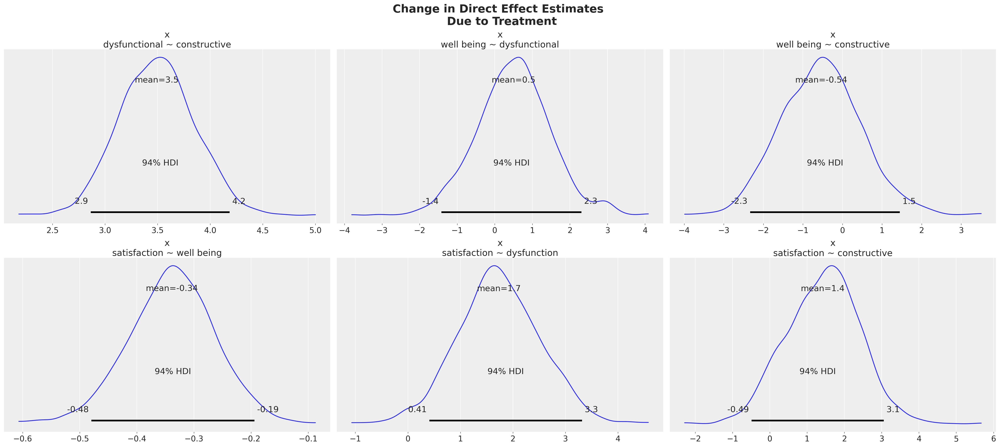

In [42]:
diff = (
    idata_hierarchical["posterior"]["mu_betas_control"]
    - idata_hierarchical["posterior"]["mu_betas_treatment"]
)

axs = az.plot_posterior(diff)
plt.suptitle(
    "Change in Direct Effect Estimates \n Due to Treatment", fontsize=20, fontweight="bold"
);

In applied work, these are precisely the implications we want to surface and understand. From a workflow perspective, our models should clarify these relationships rather than add noise. If we're assessing a particular hypothesis or aiming to estimate a concrete quantity, the model specification should be robust enough to support those inferences. This is where parameter recovery exercises can lend assurances and bolster confidence in the findings of empirical work. Here we've shown that our model specification will support inferences about about a class of particular causal contrasts i.e. how treatment changes the direct effects of one latent construct on another.

Another way we might interrogate the implications of a model is to see how well it can predict "downstream" outcomes of the implied model. How does job-satisfaction relate to attrition risk and approaches to work?

## SEM with Discrete Choice Component

Combining SEM structures with Discrete choice models involves adding an extra likelihood term dependent on the latent factors. HR managers, for instance, often monitor attrition decisions and conceptualize them as driven by abstract notions such as job satisfaction. We now have tools to measure these latent constructs — but can we predict attrition outcomes from them?

To explore this, we’ll embed a discrete choice scenario into the SEM framework. The goal is to predict a categorical outcome — whether an employee stays, quits, or quiet-quits — as a function of their job satisfaction and their perceived utility of work. Once again, we’ll frame this as a parameter recovery exercise.

![](dcm_sem.png)


The discrete choice setting is intuitive in this context because we can model the individual's subjective utility of work as a function of their job satisfaction. Within rational-choice theory, this utility determines the decision outcome.

In [43]:
observed_data_discrete = make_sample(cov_matrix, 250, FEATURE_COLUMNS)
observed_data_discrete = observed_data_discrete.values
coords["obs"] = range(len(observed_data_discrete))
coords["alts"] = ["stay", "quit", "quiet quit"]

The modelling is similar to the basic SEM set up, but we've additionally included a multinomial outcome for each of the available alternatives. Note however, that we have no alternative-specific covariates (i.e. price of the choice) since the draws of the latent constructs are fixed predictors for each of the three outcomes. As such we need to constrain one of the alternatives to 0 so it acts as the reference class and allows identification of the coefficient weights for the other alternatives. This is a basic implementation of a discrete choice model where we allow alternative-specific intercept terms to interact with the beta coefficient for each latent construct. Other variants are possible, but this example will allow us to infer how job satisfaction drives choices about work.

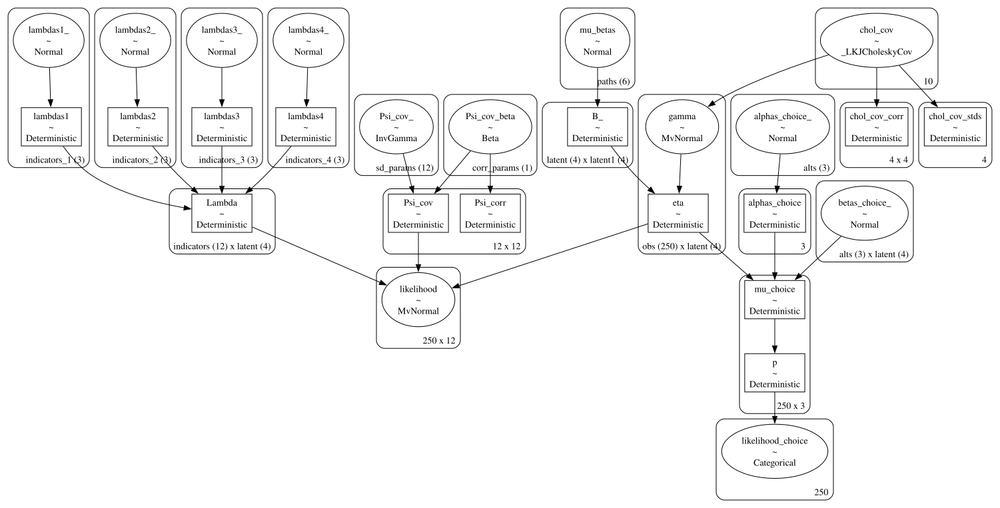

In [44]:
def make_discrete_choice_conditional(observed_data, priors, conditional=True):
    with pm.Model(coords=coords) as sem_model_discrete_choice:

        # --- Factor loadings ---
        lambdas_1 = make_lambda("indicators_1", "lambdas1", priors=priors["lambdas"])
        lambdas_2 = make_lambda("indicators_2", "lambdas2", priors=priors["lambdas"])
        lambdas_3 = make_lambda("indicators_3", "lambdas3", priors=priors["lambdas"])
        lambdas_4 = make_lambda("indicators_4", "lambdas4", priors=priors["lambdas"])

        Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

        sd_dist = pm.Exponential.dist(1.0, shape=4)
        chol, _, _ = pm.LKJCholeskyCov(
            "chol_cov", n=4, eta=priors["eta"], sd_dist=sd_dist, compute_corr=True
        )

        Psi = make_Psi("indicators")

        B = make_B()
        if conditional:
            latent_dim = len(coords["latent"])
            gamma = pm.MvNormal("gamma", 0, chol=chol, dims=("obs", "latent"))
            I = pt.eye(latent_dim)
            eta = pm.Deterministic(
                "eta", pt.slinalg.solve(I - B + 1e-8 * I, gamma.T).T, dims=("obs", "latent")
            )
            mu = pt.dot(eta, Lambda.T)
            _ = pm.MvNormal("likelihood", mu=mu, cov=Psi)
        else:
            Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
            latent_dim = len(coords["latent"])
            I = pt.eye(latent_dim)
            lhs = I - B + 1e-8 * pt.eye(latent_dim)  # (latent_dim, latent_dim)
            inv_lhs = pm.Deterministic(
                "solve_I-B", pt.slinalg.solve(lhs, pt.eye(latent_dim)), dims=("latent", "latent1")
            )

            Sigma_y = pm.Deterministic(
                "Sigma_y",
                Lambda.dot(inv_lhs).dot(Psi_zeta).dot(inv_lhs.T).dot(Lambda.T) + Psi,
            )
            ## Eta is predicted not sampled!
            M = Psi_zeta @ inv_lhs @ Lambda.T @ pm.math.matrix_inverse(Sigma_y)
            eta = pm.Deterministic("eta", (M @ (observed_data - 0).T).T, dims=("obs", "latent"))
            _ = pm.MvNormal("likelihood", mu=0, cov=Sigma_y, dims=("obs", "indicators"))

        alphas_choice_ = pm.Normal(
            "alphas_choice_", priors["alphas_choice"][0], priors["alphas_choice"][1], dims=("alts",)
        )
        ## This is an identifiability constraint similar to the Lambdas in a SEM
        ## It helps define the magnitude and scale of the latent utility measure
        ## where utility is relative among the choice to this reference choice.
        alphas_choice = pm.Deterministic("alphas_choice", pt.set_subtensor(alphas_choice_[-1], 0))

        betas_choice_ = pm.Normal(
            "betas_choice_",
            priors["betas_choice"][0],
            priors["betas_choice"][1],
            dims=("alts", "latent"),
        )
        betas_choice = pt.expand_dims(alphas_choice, 1) * betas_choice_

        utility_of_work = pm.Deterministic(
            "mu_choice", alphas_choice + pm.math.dot(eta, betas_choice.T)
        )
        p = pm.Deterministic("p", pm.math.softmax(utility_of_work, axis=1))
        _ = pm.Categorical("likelihood_choice", p)

    return sem_model_discrete_choice


priors = {
    "lambdas": [1, 0.5],
    "eta": 2,
    "B": [0, 0.5],
    "betas_choice": [0, 1],
    "alphas_choice": [0, 1],
}

priors_wide = {
    "lambdas": [1, 5],
    "eta": 2,
    "B": [0, 5],
    "betas_choice": [0, 5],
    "alphas_choice": [0, 5],
}

sem_model_discrete_choice_tight = make_discrete_choice_conditional(
    observed_data_discrete, priors, conditional=True
)
sem_model_discrete_choice_wide = make_discrete_choice_conditional(
    observed_data_discrete, priors_wide, conditional=True
)

pm.model_to_graphviz(sem_model_discrete_choice_tight)

We can see here how our model structure now has two likelihood terms that are both based on the latent constructs `eta`. 

#### The Parameter Recovery Process

To demonstrate parameter recovery we need to sample from both outcomes simultaneously. 

In [45]:
fixed_parameters = {
    "lambdas1_": [1, 0.8, 0.9],
    "lambdas2_": [1, 0.9, 1.2],
    "lambdas3_": [1, 0.95, 0.8],
    "lambdas4_": [1, 1.4, 1.1],
    "alphas_choice_": [2, 4, 1],
    # 'satisfaction', 'well being', 'dysfunctional', 'constructive'
    "betas_choice_": [[2.2, 1.2, -0.6, 1.5], [-1.5, -2, 1.7, 0.5], [-0.5, 2.5, -1.5, 1.7]],
    "chol_cov": [0.696, -0.096, 0.23, -0.3, -0.385, 0.398, -0.004, 0.043, -0.037, 0.422],
    "Psi_cov_": [0.559, 0.603, 0.666, 0.483, 0.53, 0.402, 0.35, 0.28, 0.498, 0.494, 0.976, 0.742],
    "Psi_cov_beta": [0.029],
    "mu_betas": [-0.9, -0.3, 0.5, 0.9, -0.5, 2.7],
}
with pm.do(sem_model_discrete_choice_tight, fixed_parameters) as synthetic_model:
    idata = pm.sample_prior_predictive(
        random_seed=1000
    )  # Sample from prior predictive distribution.
    synthetic_y = idata["prior"]["likelihood"].sel(draw=0, chain=0)
    synthetic_c = idata["prior"]["likelihood_choice"].sel(draw=0, chain=0)

Sampling: [gamma, likelihood, likelihood_choice]


Now we see how much we can infer from these two sampled outcomes. 

In [46]:
# Infer parameters conditioned on observed data
with pm.observe(
    sem_model_discrete_choice_wide, {"likelihood": synthetic_y, "likelihood_choice": synthetic_c}
) as inference_model:
    idata = pm.sample_prior_predictive()
    idata.extend(pm.sample(random_seed=100, chains=4, tune=2000, draws=500))

Sampling: [Psi_cov_, Psi_cov_beta, alphas_choice_, betas_choice_, chol_cov, gamma, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, likelihood_choice, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, Psi_cov_, Psi_cov_beta, mu_betas, gamma, alphas_choice_, betas_choice_]


Output()

Sampling 4 chains for 2_000 tune and 500 draw iterations (8_000 + 2_000 draws total) took 376 seconds.
There were 15 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


The factor structures are nicely recovered. 

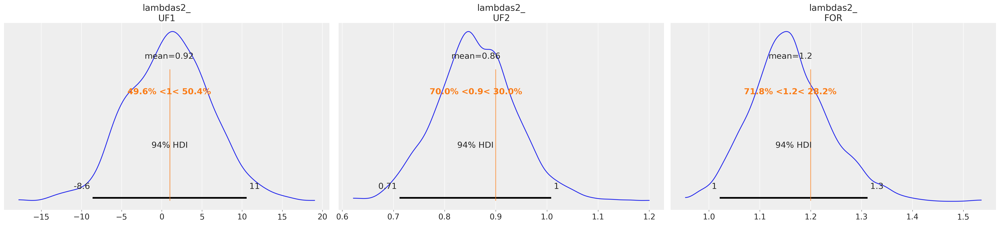

In [47]:
az.plot_posterior(idata, var_names=["lambdas2_"], ref_val=fixed_parameters["lambdas2_"]);

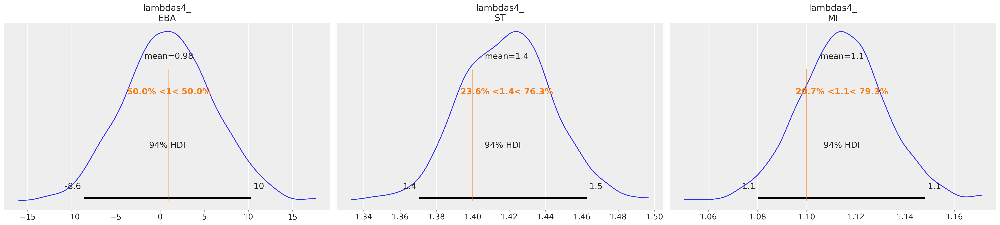

In [48]:
az.plot_posterior(idata, var_names=["lambdas4_"], ref_val=fixed_parameters["lambdas4_"]);

The `B` parameters seem to be approximately well identified. 

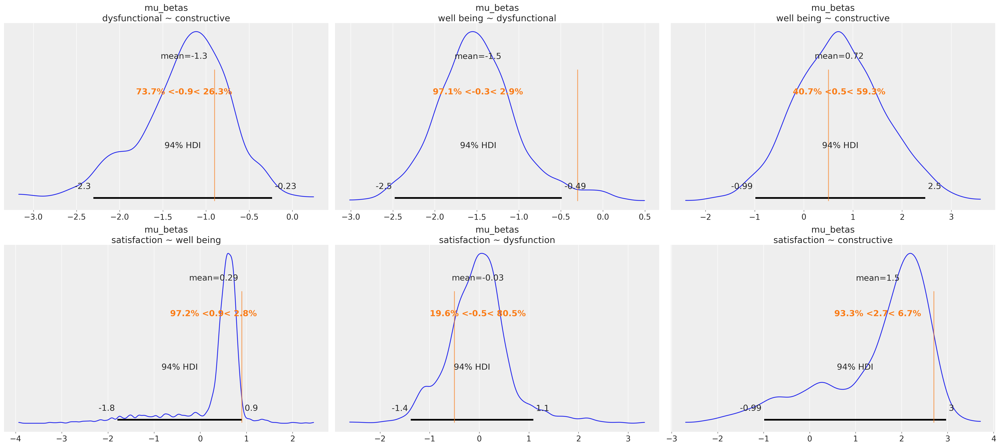

In [49]:
az.plot_posterior(idata, var_names=["mu_betas"], ref_val=fixed_parameters["mu_betas"]);

Now we look at the beta coefficients from the discrete choice setting, noting that the model can recover sensible values. 

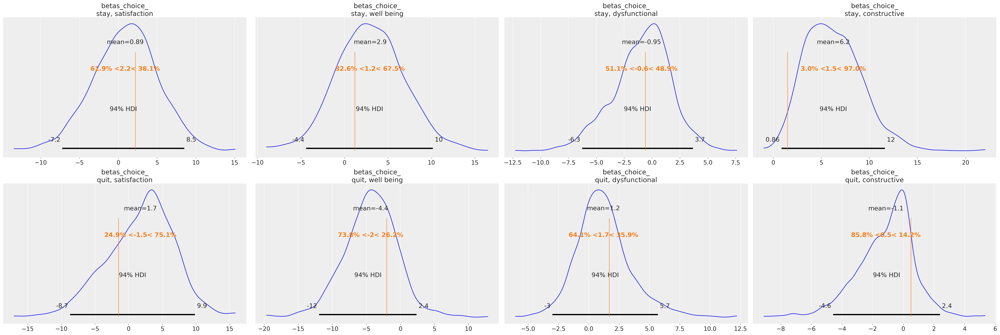

In [50]:
ref = (
    fixed_parameters["betas_choice_"][0]
    + fixed_parameters["betas_choice_"][1]
    + fixed_parameters["betas_choice_"][2]
)
az.plot_posterior(
    idata,
    var_names=["betas_choice_"],
    ref_val=ref,
    coords={"alts": ["stay", "quit"]},
);

Similarly, the intercept terms are properly recovered.

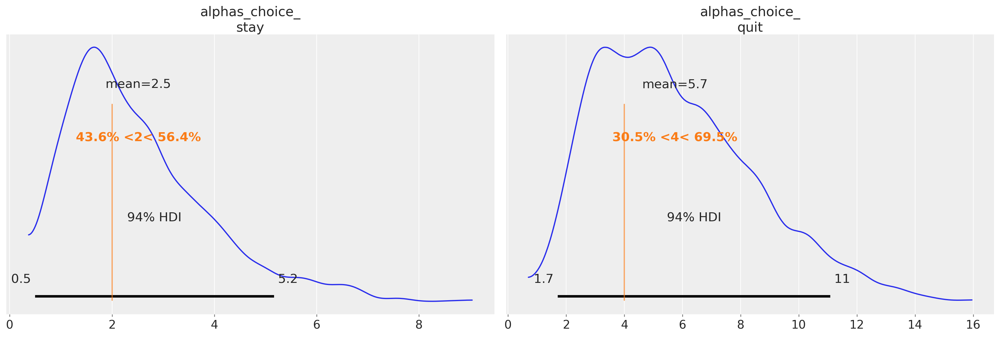

In [51]:
az.plot_posterior(
    idata,
    var_names=["alphas_choice_"],
    ref_val=fixed_parameters["alphas_choice_"],
    coords={"alts": ["stay", "quit"]},
);

But what does the model say about the relationships between our latent constructs? 



In [52]:
with inference_model:
    idata.extend(pm.sample_posterior_predictive(idata))

Sampling: [likelihood, likelihood_choice]


Output()

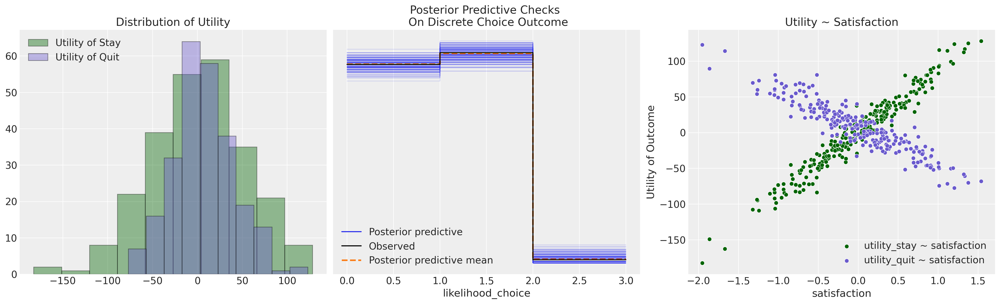

In [53]:
utility_df = (
    az.extract(idata["posterior"])["mu_choice"]
    .mean(dim=("sample"))
    .to_dataframe()
    .reset_index()
    .pivot(index="mu_choice_dim_0", columns="mu_choice_dim_1", values="mu_choice")
    .rename({0: "stay", 1: "quit", 2: "quiet_quit"}, axis=1)
)

latent_df = (
    az.extract(idata)["eta"]
    .mean(dim="sample")
    .to_dataframe()
    .reset_index()
    .pivot(index="obs", columns="latent", values="eta")
)

full_df = pd.concat([utility_df.reset_index(), latent_df.reset_index()])

fig, axs = plt.subplots(1, 3, figsize=(20, 6))
axs[0].hist(utility_df["stay"], ec="black", alpha=0.4, color="darkgreen", label="Utility of Stay")
axs[0].hist(utility_df["quit"], ec="black", alpha=0.4, color="slateblue", label="Utility of Quit")

sns.scatterplot(
    full_df,
    x="satisfaction",
    y="stay",
    ax=axs[2],
    color="darkgreen",
    label="utility_stay ~ satisfaction",
)
sns.scatterplot(
    full_df,
    x="satisfaction",
    y="quit",
    ax=axs[2],
    color="slateblue",
    label="utility_quit ~ satisfaction",
)
az.plot_ppc(idata, var_names=["likelihood_choice"], ax=axs[1])
axs[1].set_title("Posterior Predictive Checks \n On Discrete Choice Outcome")
axs[2].set_ylabel("Utility of Outcome")
axs[2].set_title("Utility ~ Satisfaction")
axs[0].set_title("Distribution of Utility")
axs[0].legend()
axs[1].legend();

We can recover the inverse relationship we encoded in the outcomes between job-satisfaction and the choice to stay. Similarly, this posterior predictive checks look sound. This is encouraging. 

The "action" in human decision making is often understood to be driven by these hard-to-quantify constructs that determine motivation. SEM with a discrete choice component offers us a way to model these processes, while allowing for measurement error between the observables and the latent drivers of choice. Secondly, we are triangulating the values of the system between two sources of observable data. On the one hand, we measure latent constructs in the SEM with a range of survey measures (`JW1`, `JW2`, ... ) but then calibrate the consequences of that measurement against revealed choice data. This dual calibration offers a powerful approach to understanding how latent dispositions translate into observable actions.

We abstract over the _expressed attitudes_ of rational agents, deriving interpretable representations of latent attitudes from expressed opinions. These representations are then further calibrated against the _observed choices_ made by the agents. This two-step process of information compression and prediction serves to concisely quantify and evaluate the idiosyncratic attitudes of a population of complex agents. As we iteratively layer-in these constructs in our model development, we come to understand their baseline and interactive effects. This perspective helps us gauge the coherence between attitudes and actions of the agents under study. 

The same workflow extends seamlessly to computational agents, where latent variables represent more opaque internal states or reward expectations. In both human and artificial systems, discrete choice modelling provides a common language for interpreting how such latent structure generates behavioral choices.

## Conclusion: Workflow and Craft in Statistical Modelling

We have now seen how to articulate Structural Equation models and their variants in PyMC. The SEM workflow is, at heart, Bayesian in temperament. Hypothesise and construct. Construct then Estimate. Estimate and check. Check then refine. Refine then expand... Both disciplines reject the checklist mentality of “fit once, report, move on.” Instead, they cultivate a focused, deliberate practice. Each demands an apprenticeship in which skill is honed: skill to see how assumptions shape understanding, and how the world resists the imposition of false structures. Skill to find the right structures. Each iteration is a dialogue between theory and evidence. At each juncture we ask whether this model speaks true? Whether this structure reflects the facts to hand? 

Of course, the craft ideal has its limits. The Bayesian workflow, for all its discipline and transparency, cannot by itself guarantee truth. Every model remains a conditional story, framed by the priors we choose and the theories we inherit. Iteration can refine these frames, but it can also entrench them. The aspiration to know what our models say must also include the humility to accept what they cannot reveal. Theory driven models, developed through iterative checking and clear communication, are more robust to misspecification, more transparent to collaborators, and more resistant to the subtle distortions of overfitting and overconfidence.

In the end, the value of craft in statistical modeling lies not in merely improving benchmark metrics, but in the depth of understanding we cultivate through careful communication and justification. The Bayesian workflow reminds us that modeling is not the automation of insight, but its deliberate construction. Our workflow is a process of listening, revising, and re-articulating until the model speaks clearly. Like any craft, its worth is measured not by throughput but by fidelity: how honestly our structure reflects the world it seeks to describe. Each diagnostic, each posterior check, each refinement of a latent path is a form of attention — a small act of resistance against the flattening logic of target metrics and checklists. These constructive habits and reflective practices are the source of fulfillment in the work. __To practice modeling as craft is to reclaim pride in knowing what our models say, what they do not say, and what they imply__  -  and to find, in that discipline and skilled attention, the satisfaction of meaningful work and useful science.


## Authors
- Authored by [Nathaniel Forde](https://nathanielf.github.io/) in November 2025 

## References
:::{bibliography}
:filter: docname in docnames
:::

## Watermark

In [54]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pytensor

Last updated: Tue Oct 21 2025

Python implementation: CPython
Python version       : 3.10.15
IPython version      : 8.32.0

pytensor: 2.25.5

pytensor  : 2.25.5
arviz     : 0.20.0
numpy     : 1.26.4
matplotlib: 3.9.2
pandas    : 2.3.2
seaborn   : 0.13.2
pymc      : 5.17.0

Watermark: 2.5.0



:::{include} ../page_footer.md
:::